### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Import Libraries

In [44]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns

from scipy.stats import zscore                                        # ZSCORE SCALING
from sklearn.preprocessing import StandardScaler                      # ZScore
from sklearn.preprocessing import MinMaxScaler                        # Min Max Scaler

from sklearn.linear_model import LogisticRegression                   # Logistic Regression

from sklearn import metrics, model_selection                          # Evaluation Metrics
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,accuracy_score,roc_auc_score,roc_curve, precision_recall_curve

from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search


%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('Accent_r')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Load Dataset

In [45]:
df = pd.read_excel('Company_Data2015-1.xlsx')
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Renaming Column Names

In [46]:
df.columns = df.columns.str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('%', 'perc').str.replace('/', '_to_').str.replace('[', '_').str.replace(']', '').str.replace('-', '_')

In [47]:
df['Current_Liabilities_and_Provisions'] = df['Current_Liabilities_and_Provisions_']
df['Total_Assets_to_Liabilities'] = df['Total_Assets_to_Liabilities_']
df['Gross_Block'] = df['Gross_Block_']
df['Net_Working_Capital'] = df['Net_Working_Capital_']
df['Current_Assets'] = df['Current_Assets_']
df['Book_Value_Adj_Unit_Curr'] = df['Book_Value_Adj._Unit_Curr']

In [48]:
df.drop(['Current_Liabilities_and_Provisions_', 'Total_Assets_to_Liabilities_', 'Gross_Block_', 'Net_Working_Capital_', 'Current_Assets_', 'Book_Value_Adj._Unit_Curr'], axis=1, inplace=True)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Basic Exploration

In [49]:
print('Number of Rows(Companies) =', df.shape[0])
print('Number of Columns =', df.shape[1])

Number of Rows(Companies) = 3586
Number of Columns = 67


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth_Next_Year                   3586 non-null   float64
 3   Equity_Paid_Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital_Employed                     3586 non-null   float64
 6   Total_Debt                           3586 non-null   float64
 7   Gross_Sales                          3586 non-null   float64
 8   Net_Sales                            3586 non-null   float64
 9   Other_Income                         3586 non-null   float64
 10  Value_Of_Output                      3586 non-null   float64
 11  Cost_of_Production            

In [51]:
df.shape

(3586, 67)

In [52]:
df.head()

,Co_Code,Co_Name,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89


In [53]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.0,16065.388734,19776.817379,4.00,3029.2500,6077.500,24269.5000,72493.00
Networth_Next_Year,3586.0,725.045251,4769.681004,-8021.60,3.9850,19.015,123.8025,111729.10
Equity_Paid_Up,3586.0,62.966584,778.761744,0.00,3.7500,8.290,19.5175,42263.46
Networth,3586.0,649.746299,4091.988792,-7027.48,3.8925,18.580,117.2975,81657.35
Capital_Employed,3586.0,2799.611054,26975.135385,-1824.75,7.6025,39.090,226.6050,714001.25
Total_Debt,3586.0,1994.823779,23652.842746,-0.72,0.0300,7.490,72.3500,652823.81
Gross_Sales,3586.0,1123.738985,10603.703837,-62.59,1.4425,31.210,242.2500,474182.94
Net_Sales,3586.0,1079.702579,9996.574173,-62.59,1.4400,30.440,234.4400,443775.16
Other_Income,3586.0,48.729824,426.040665,-448.72,0.0200,0.450,3.6350,14143.40
Value_Of_Output,3586.0,1077.187292,9843.880293,-119.10,1.4125,30.895,235.8375,435559.09


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Checking Duplicates

In [54]:
print('Number of Duplicates =', df.duplicated().sum().sum())

Number of Duplicates = 0


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dropping Unique Identifiers

Unique Identifiers do not add any value to model building, hence dropping them

In [55]:
df.drop(['Co_Code', 'Co_Name'], axis=1, inplace=True)
df.head()

,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18
2,-3192.58,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14
3,-3054.51,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64
4,-2967.36,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89


In [56]:
df.shape

(3586, 65)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Creating Target/Response Variable

* We consider 'Networth Next Year' as our Default Variable
* SO, we call negative values as Default = 1
* And, positive values as Default = 0

In [57]:
df_orig = df.copy()
df['default'] = np.where(df['Networth_Next_Year']>=0, 0, 1)
df[['default', 'Networth_Next_Year']].head().to_csv('target_head.csv')
df[['default', 'Networth_Next_Year']].tail().to_csv('target_tail.csv')

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Dropping variable 'Networth Next Year'

In [58]:
df.drop('Networth_Next_Year', axis=1, inplace=True)
df.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr,default
0,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58,1
1,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18,1
2,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14,1
3,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64,1
4,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89,1


In [59]:
df.shape

(3586, 65)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Missing Value Treatment

In [60]:
print('MISSING VALUES PER VARIABLE -->')
print('')
df.isnull().sum()

MISSING VALUES PER VARIABLE -->



Equity_Paid_Up                           0
Networth                                 0
Capital_Employed                         0
Total_Debt                               0
Gross_Sales                              0
Net_Sales                                0
Other_Income                             0
Value_Of_Output                          0
Cost_of_Production                       0
Selling_Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted_PAT                             0
CP                                       0
Revenue_earnings_in_forex                0
Revenue_expenses_in_forex                0
Capital_expenses_in_forex                0
Book_Value_Unit_Curr                     0
Market_Capitalisation                    0
CEPS_annualised_Unit_Curr                0
Cash_Flow_F

In [61]:
print('PERCENT OF MISSING VALUES TO THE WHOLE DATA --->')
print('')
round(df.isna().sum()*100/df.shape[0], 2)

PERCENT OF MISSING VALUES TO THE WHOLE DATA --->



Equity_Paid_Up                         0.00
Networth                               0.00
Capital_Employed                       0.00
Total_Debt                             0.00
Gross_Sales                            0.00
Net_Sales                              0.00
Other_Income                           0.00
Value_Of_Output                        0.00
Cost_of_Production                     0.00
Selling_Cost                           0.00
PBIDT                                  0.00
PBDT                                   0.00
PBIT                                   0.00
PBT                                    0.00
PAT                                    0.00
Adjusted_PAT                           0.00
CP                                     0.00
Revenue_earnings_in_forex              0.00
Revenue_expenses_in_forex              0.00
Capital_expenses_in_forex              0.00
Book_Value_Unit_Curr                   0.00
Market_Capitalisation                  0.00
CEPS_annualised_Unit_Curr       

In [62]:
print('Percent of Total Missing Values in the data =' ,(df.isna().sum().sum()*100/df.size).round(2), "%")

Percent of Total Missing Values in the data = 0.05 %


* We note that there are not many missing values
* We'll come back to this

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Checking Zero Values

In [63]:
(df.drop('default', axis=1)==0).sum().sort_values(ascending=False)

Capital_expenses_in_forex              2892
ROG_Revenue_earnings_in_forex_perc     2269
Revenue_earnings_in_forex              2230
ROG_Revenue_expenses_in_forex_perc     1971
Revenue_expenses_in_forex              1909
ROG_Market_Capitalisation_perc         1422
Market_Capitalisation                  1249
Inventory_Velocity_Days                1123
Inventory_Ratio_Latest                 1100
Interest_Cover_Ratio_Latest            1001
ROG_Gross_Block_perc                    940
Selling_Cost                            938
Total_Debt                              844
Debtors_Ratio_Latest                    745
Debtors_Velocity_Days                   729
Creditors_Velocity_Days                 704
Other_Income                            690
Cash_Flow_From_Financing_Activities     656
Value_of_Output_to_Gross_Block          611
Fixed_Assets_Ratio_Latest               607
Cash_Flow_From_Investing_Activities     510
Total_Asset_Turnover_Ratio_Latest       493
Value_of_Output_to_Total_Assets 

In [64]:
round(((df.drop('default', axis=1)==0).sum())*100/df.shape[0], 2).sort_values(ascending=False)

Capital_expenses_in_forex              80.65
ROG_Revenue_earnings_in_forex_perc     63.27
Revenue_earnings_in_forex              62.19
ROG_Revenue_expenses_in_forex_perc     54.96
Revenue_expenses_in_forex              53.23
ROG_Market_Capitalisation_perc         39.65
Market_Capitalisation                  34.83
Inventory_Velocity_Days                31.32
Inventory_Ratio_Latest                 30.67
Interest_Cover_Ratio_Latest            27.91
ROG_Gross_Block_perc                   26.21
Selling_Cost                           26.16
Total_Debt                             23.54
Debtors_Ratio_Latest                   20.78
Debtors_Velocity_Days                  20.33
Creditors_Velocity_Days                19.63
Other_Income                           19.24
Cash_Flow_From_Financing_Activities    18.29
Value_of_Output_to_Gross_Block         17.04
Fixed_Assets_Ratio_Latest              16.93
Cash_Flow_From_Investing_Activities    14.22
Total_Asset_Turnover_Ratio_Latest      13.75
Value_of_O

In [65]:
((df.drop('default', axis=1)==0).sum().sum())*100/df.drop('default', axis=1).size

15.111719185722253

* There are many variables with a lot of zero values (15.1%)
* They may be correct values at times, but also seems like a missing data replaced with zero
* Let us for this analysis, decide to ignore and drop all variables with number of zeros greater than 30%
* We drop the top 9 variables from above

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Dropping Variables with zeros greater than 30%

In [66]:
df.drop(['Capital_expenses_in_forex', 'ROG_Revenue_earnings_in_forex_perc', 'Revenue_earnings_in_forex', 'ROG_Revenue_expenses_in_forex_perc', 'Revenue_expenses_in_forex', 'ROG_Market_Capitalisation_perc', 'Market_Capitalisation', 'Inventory_Velocity_Days', 'Inventory_Ratio_Latest'], axis=1, inplace=True)
df.shape

(3586, 56)

In [67]:
df.columns

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Converting other Zeros to Missing Values for Treatment

In [68]:
df1 = df.drop('default', axis=1)
df1[df1==0] = np.nan
(df1==0).sum()
(df1==0).shape
df1.shape

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

(3586, 55)

(3586, 55)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Visualising Missing Values

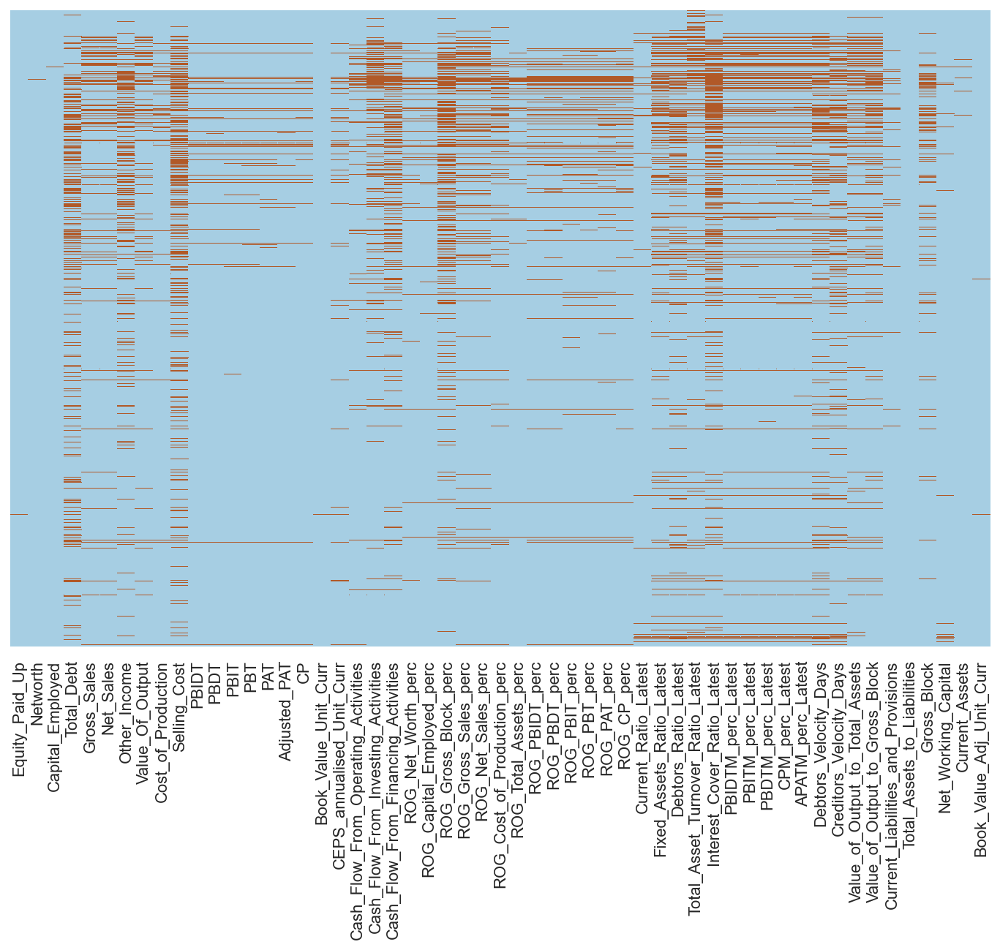

In [69]:
plt.figure(figsize = (12,8))
sns.heatmap(df1.isnull(), cbar = False, cmap = 'Paired', yticklabels = False)
plt.savefig('missing_vis.jpg', bbox_inches='tight');
plt.show();

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Checking Missing Values by Rows

* We check for rows with more than 5 missing values
* Out of these rows, we note that 164 out of 387 defaults exist
* Hence, we ll not drop these rows
* But, also conclude that more the missing or zero values, higher is the probability of default

In [70]:
df1['default'] = df['default']
df_rows = df1[df1.isna().sum(axis=1)>5]
df_rows.shape

(1004, 56)

In [71]:
df1['default'].value_counts()
df_rows['default'].value_counts()

0    3199
1     387
Name: default, dtype: int64

0    840
1    164
Name: default, dtype: int64

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Split Target and Predictor Variables

In [72]:
df_x = df1.drop('default', axis=1)
df_y = df1['default']

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Impute Null Values using KNN Imputer
    n_neighbors=10

In [73]:
df1.isna().sum()

Equity_Paid_Up                            1
Networth                                  3
Capital_Employed                          5
Total_Debt                              844
Gross_Sales                             305
Net_Sales                               306
Other_Income                            690
Value_Of_Output                         290
Cost_of_Production                      159
Selling_Cost                            938
PBIDT                                   102
PBDT                                    108
PBIT                                    109
PBT                                     119
PAT                                     121
Adjusted_PAT                            124
CP                                      111
Book_Value_Unit_Curr                      1
CEPS_annualised_Unit_Curr               139
Cash_Flow_From_Operating_Activities     180
Cash_Flow_From_Investing_Activities     510
Cash_Flow_From_Financing_Activities     656
ROG_Net_Worth_perc              

In [74]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=10)

df_imputed = pd.DataFrame(imputer.fit_transform(df1), columns = df1.columns)

df_imputed.isnull().sum()

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Outlier Treatment using IQR method

In [75]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [76]:
df_x = df_imputed.drop('default', axis=1)
df_y = df_imputed['default']

In [77]:
for column in df_x.columns:
    lr,ur=remove_outlier(df_x[column])
    df_x[column]=np.where(df_x[column]>ur,ur,df_x[column])
    df_x[column]=np.where(df_x[column]<lr,lr,df_x[column])

In [78]:
df = pd.concat([df_x, df_y], axis = 1)

In [79]:
df.shape

(3586, 56)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6">Correlation Heatmap

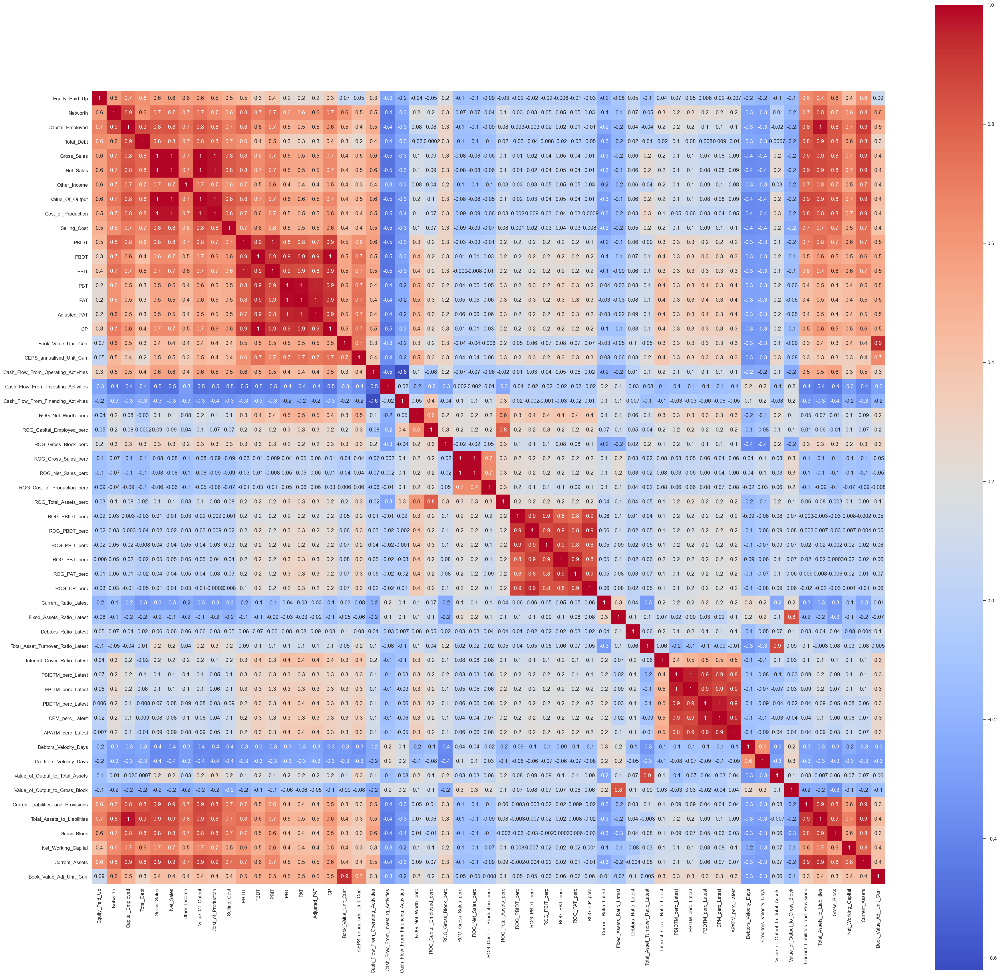

In [80]:
#calculate column correlations and make a seaborn heatmap - Before standardisation

plt.figure(figsize=(40,40))
p=sns.heatmap(df_x.corr(), annot=True,cmap='coolwarm',square=True, fmt='.1g')
plt.savefig('heatmap_dfx_55vars.jpg', bbox_inches='tight');

* We see a lot of red patches showing high correlation between variables
* This gives rise to issues of Multi-Collinearity
* Lets check for Multi-Collinearity using Variance Inflation Factor

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Check Multi-Colinearity using Variance Inflation Factor

In [81]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [82]:
X = df_x.copy()
f = calc_vif(X).sort_values(by = 'VIF', ascending = False)
f

,variables,VIF
5,Net_Sales,1155.479289
25,ROG_Gross_Sales_perc,990.784386
26,ROG_Net_Sales_perc,989.280569
4,Gross_Sales,692.791960
7,Value_Of_Output,475.547298
11,PBDT,118.320353
50,Total_Assets_to_Liabilities,106.812670
16,CP,104.422022
14,PAT,76.554676
13,PBT,75.937631


In [83]:
X.shape
X.columns

(3586, 55)

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dropping Variables recursively with VIF greater than 5

* We check VIF of all predictor variables
* We arrange these variables in decreasing order of VIF
* We check if the top variable has VIF > 5
* If yes, then we drop ONLY this Top Variable and check for VIF again
* We run this in a loop and drop variables one by one till we get max VIF < 5

In [84]:
import time
start = time.time()

for i in range(55):
    v = calc_vif(X).sort_values(by = 'VIF', ascending = False)
    if (v.iloc[0,1] > 5):
        X = X.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Time taken = 19.196288108825684


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Check VIF again

In [85]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)


,variables,VIF
1,Total_Debt,4.894654
5,CEPS_annualised_Unit_Curr,4.441096
3,Selling_Cost,4.129128
10,ROG_Capital_Employed_perc,3.859918
0,Equity_Paid_Up,3.751747
2,Other_Income,3.644490
6,Cash_Flow_From_Operating_Activities,3.576169
26,Book_Value_Adj_Unit_Curr,3.363715
14,ROG_Total_Assets_perc,3.326385
4,Adjusted_PAT,3.279813


In [86]:
X.shape
X.head()

(3586, 27)

,Equity_Paid_Up,Total_Debt,Other_Income,Selling_Cost,Adjusted_PAT,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,Current_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr
0,43.16875,220.71875,7.600,0.49200,-8.36,-13.175,-19.9575,1.46000,12.044375,-15.310000,-20.76,-9.75,-19.071000,1.38,-25.75,5.23000,-19.3300,0.02,7.075,1.328,-0.20,-24.496875,284.800,153.1,6.97,-92.37375,-72.365
1,43.16875,220.71875,9.602,11.90625,-8.36,-0.020,32.3025,-13.43375,12.044375,-25.214375,6.30,3.17,5.920000,13.16,6.66,5.24000,-9.8500,0.08,10.350,0.300,-0.84,-24.496875,29.000,101.0,0.24,-92.37375,-15.180
2,43.16875,220.71875,9.550,11.90625,-8.36,-13.175,-19.9575,-13.43375,12.044375,-25.214375,15.66,-2.07,-75.870000,-69.93,-0.78,-159.95625,-244.9875,1.06,0.420,0.287,-2.21,-24.496875,97.000,558.0,-0.26,156.79625,94.140
3,43.16875,220.71875,9.602,3.34000,-8.36,-13.175,32.3025,8.39625,-16.774625,-25.214375,-31.84,-1.80,8.330000,16.59,-10.12,-159.95625,-80.2300,0.09,9.260,0.602,-0.16,-24.496875,93.000,63.0,1.90,-92.37375,-39.640
4,43.16875,220.71875,9.602,1.97000,-8.36,-13.175,-19.9575,8.39625,12.044375,-25.214375,-11.76,0.34,-78.725625,-48.80,-5.81,-40.07000,1.8700,0.50,1.280,0.010,-0.73,29.042125,741.375,346.0,0.05,156.79625,-72.365


* After dropping variables one by one with high VIF (>5)
* We are left with final 27 predictor variables for modelling

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Scale the data using Standard Scaler

In [87]:
sc = StandardScaler()
scaled_x = pd.DataFrame(sc.fit_transform(X), columns=X.columns)
scaled_x.shape
scaled_x.head()

(3586, 27)

,Equity_Paid_Up,Total_Debt,Other_Income,Selling_Cost,Adjusted_PAT,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,Current_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr
0,2.083934,1.983979,1.386708,-0.576680,-1.677338,-1.997348,-1.824762,0.647296,1.684582,-1.198860,-1.381623,-0.159197,-0.716531,-0.284501,-1.719517,-0.070905,-0.186899,-1.122947,-0.279521,0.220992,-0.627646,-1.663614,0.213101,-0.175320,-0.036951,-2.122059,-2.204582
1,2.083934,1.983979,1.942253,1.951643,-1.677338,-0.538480,1.785208,-1.756109,1.684582,-1.794636,0.053718,0.260468,-0.202754,-0.022227,0.096606,-0.070793,-0.113376,-1.093242,0.071760,-0.745540,-0.721072,-1.663614,-0.730131,-0.395560,-0.810397,-2.122059,-1.063848
2,2.083934,1.983979,1.927823,1.951643,-1.677338,-1.997348,-1.824762,-1.756109,1.684582,-1.794636,0.550199,0.090263,-1.884232,-1.872171,-0.320301,-1.916753,-1.937016,-0.608063,-0.993346,-0.757763,-0.921061,-1.663614,-0.479389,1.536300,-0.867860,1.916351,1.116881
3,2.083934,1.983979,1.942253,0.054169,-1.677338,-1.997348,1.785208,1.766599,-1.730935,-1.794636,-1.969338,0.099033,-0.153208,0.054140,-0.843676,-1.916753,-0.659217,-1.088291,-0.045155,-0.461598,-0.621807,-1.663614,-0.494138,-0.556196,-0.619621,-2.122059,-1.551780
4,2.083934,1.983979,1.942253,-0.249294,-1.677338,-1.997348,-1.824762,1.766599,1.684582,-1.794636,-0.904237,0.168544,-1.942939,-1.401725,-0.602161,-0.577103,-0.022479,-0.885308,-0.901101,-1.018200,-0.705014,1.793199,1.896668,0.640120,-0.832233,1.916351,-2.204582


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Concatenate Predictor and Target Variables for Logistic Regression using Stats Model

In [88]:
df_1 = pd.concat([scaled_x, df_y], axis=1)
df_1.head()
df_1.shape

,Equity_Paid_Up,Total_Debt,Other_Income,Selling_Cost,Adjusted_PAT,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,Current_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr,default
0,2.083934,1.983979,1.386708,-0.576680,-1.677338,-1.997348,-1.824762,0.647296,1.684582,-1.198860,-1.381623,-0.159197,-0.716531,-0.284501,-1.719517,-0.070905,-0.186899,-1.122947,-0.279521,0.220992,-0.627646,-1.663614,0.213101,-0.175320,-0.036951,-2.122059,-2.204582,1.0
1,2.083934,1.983979,1.942253,1.951643,-1.677338,-0.538480,1.785208,-1.756109,1.684582,-1.794636,0.053718,0.260468,-0.202754,-0.022227,0.096606,-0.070793,-0.113376,-1.093242,0.071760,-0.745540,-0.721072,-1.663614,-0.730131,-0.395560,-0.810397,-2.122059,-1.063848,1.0
2,2.083934,1.983979,1.927823,1.951643,-1.677338,-1.997348,-1.824762,-1.756109,1.684582,-1.794636,0.550199,0.090263,-1.884232,-1.872171,-0.320301,-1.916753,-1.937016,-0.608063,-0.993346,-0.757763,-0.921061,-1.663614,-0.479389,1.536300,-0.867860,1.916351,1.116881,1.0
3,2.083934,1.983979,1.942253,0.054169,-1.677338,-1.997348,1.785208,1.766599,-1.730935,-1.794636,-1.969338,0.099033,-0.153208,0.054140,-0.843676,-1.916753,-0.659217,-1.088291,-0.045155,-0.461598,-0.621807,-1.663614,-0.494138,-0.556196,-0.619621,-2.122059,-1.551780,1.0
4,2.083934,1.983979,1.942253,-0.249294,-1.677338,-1.997348,-1.824762,1.766599,1.684582,-1.794636,-0.904237,0.168544,-1.942939,-1.401725,-0.602161,-0.577103,-0.022479,-0.885308,-0.901101,-1.018200,-0.705014,1.793199,1.896668,0.640120,-0.832233,1.916351,-2.204582,1.0


(3586, 28)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Split the whole data into Train and Test 67-33

In [89]:

X_train, X_test, y_train, y_test = train_test_split(scaled_x, df_y, 
                                                    test_size = 0.33, random_state=42)

In [90]:
df1_train = pd.concat([X_train, y_train], axis=1)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Logistic Regression using StatsModel

In [91]:
scaled_x.columns
scaled_x.shape

Index(['Equity_Paid_Up', 'Total_Debt', 'Other_Income', 'Selling_Cost', 'Adjusted_PAT', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBT_perc', 'Current_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days', 'Value_of_Output_to_Gross_Block', 'Net_Working_Capital', 'Book_Value_Adj_Unit_Curr'], dtype='object')

(3586, 27)

### <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#02A3FF"> MODEL 1

In [92]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_1 = SM.Logit(y_train, X_train).fit()
print(model_1.summary())

Optimization terminated successfully.
         Current function value: 0.616807
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2375
Method:                           MLE   Df Model:                           26
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                 -0.8722
Time:                        14:55:58   Log-Likelihood:                -1481.6
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Equity_Paid_Up                         -0.1875      0.064 

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Metrics of Model 1

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TRAIN MODEL 1')

              precision    recall  f1-score   support

         0.0       1.00      0.60      0.75      2157
         1.0       0.22      0.98      0.36       245

    accuracy                           0.64      2402
   macro avg       0.61      0.79      0.55      2402
weighted avg       0.92      0.64      0.71      2402



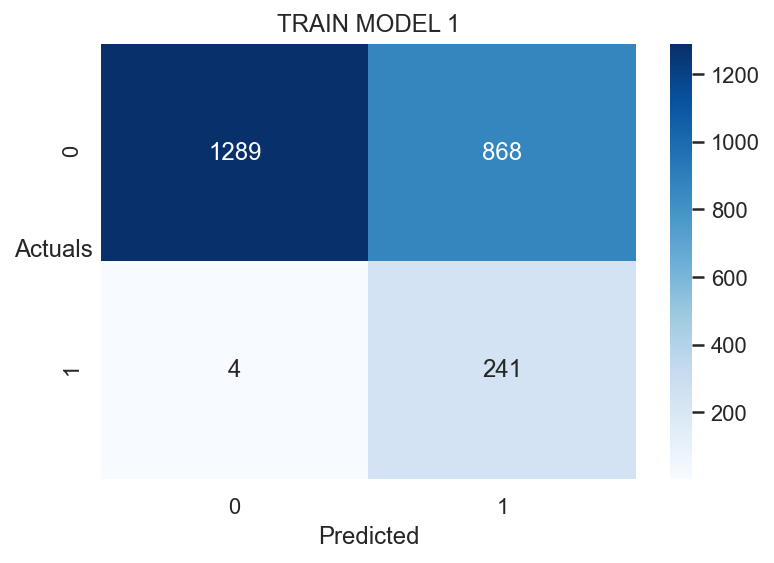

In [93]:
## MODEL 1 TRAIN

y_prob_pred_train = model_1.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 1')

print(metrics.classification_report(y_train,y_class_pred))

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 1')

              precision    recall  f1-score   support

         0.0       1.00      0.55      0.71      1042
         1.0       0.23      0.99      0.38       142

    accuracy                           0.61      1184
   macro avg       0.62      0.77      0.54      1184
weighted avg       0.91      0.61      0.67      1184



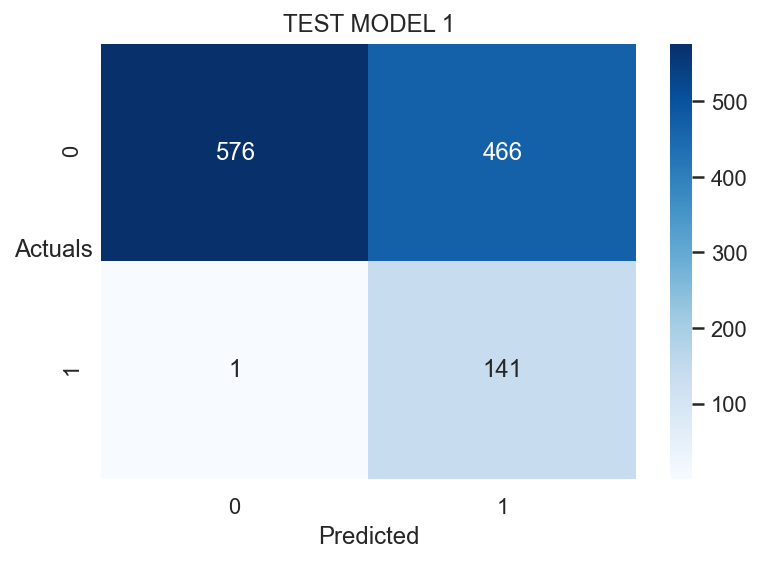

In [94]:
## MODEL 2 TEST

y_prob_pred_test = model_1.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 1')

print(metrics.classification_report(y_test,y_class_pred))

In [95]:
X_test.shape

(1184, 27)

### <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#02A3FF"> MODEL 2

In [96]:
v = pd.DataFrame(model_1.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
v

,index,pvalue
0,ROG_Cost_of_Production_perc,8.211513e-01
1,Cash_Flow_From_Investing_Activities,7.988386e-01
2,Value_of_Output_to_Gross_Block,7.939213e-01
3,ROG_Net_Sales_perc,7.699661e-01
4,Interest_Cover_Ratio_Latest,7.257786e-01
5,Selling_Cost,7.048800e-01
6,Adjusted_PAT,6.225951e-01
7,ROG_Capital_Employed_perc,5.917661e-01
8,Debtors_Ratio_Latest,5.710823e-01
9,Total_Asset_Turnover_Ratio_Latest,4.287622e-01


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dropping Variables recursively with p-values greater than 0.05

* We check p-values of all predictor variables
* We arrange these variables in decreasing order of p-values
* We check if the top predictor variable has p-value > 0.05
* If yes, then it means that this variable is not significant in predicting default at 95% Confidence
* Hence, we drop ONLY this Top Variable and check for p-values again
* We run this in a loop and drop variables one by one till we get all p-values < 0.05

In [97]:
import time
start = time.time()

for i in range(25):
    model_2 = SM.Logit(y_train, X_train).fit()
    v = pd.DataFrame(model_2.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v.iloc[0,1] > 0.05):
        X_train = X_train.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.616807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616818
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616904
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617085
  

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Check p-values again

In [98]:
print(model_2.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2392
Method:                           MLE   Df Model:                            9
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                 -0.8827
Time:                        14:55:59   Log-Likelihood:                -1489.9
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Equity_Paid_Up              -0.2211      0.060     -3.655      0.000      -0.340      -0.103
Total_Debt                   0.3199      0.078      4.086      0.000       0.166       0.

* We note that only those variables are included in the model which p-values less than 0.05
* All other variables with p-values > 0.05 are recursively dropped one by one

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Re-setting the Test set with only the required 11 variables chosen

In [99]:
X_train.shape

(2402, 10)

In [100]:
y_train.shape

(2402,)

In [101]:
X_test = X_test[X_train.columns]

In [102]:
X_test.shape

(1184, 10)

In [103]:
X_test.columns

Index(['Equity_Paid_Up', 'Total_Debt', 'Other_Income', 'ROG_Net_Worth_perc', 'ROG_PBIDT_perc', 'ROG_PBT_perc', 'Current_Ratio_Latest', 'APATM_perc_Latest', 'Net_Working_Capital', 'Book_Value_Adj_Unit_Curr'], dtype='object')

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Metrics of Model 2

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TRAIN MODEL 2')

              precision    recall  f1-score   support

         0.0       1.00      0.59      0.74      2157
         1.0       0.21      0.98      0.35       245

    accuracy                           0.63      2402
   macro avg       0.61      0.79      0.55      2402
weighted avg       0.92      0.63      0.70      2402



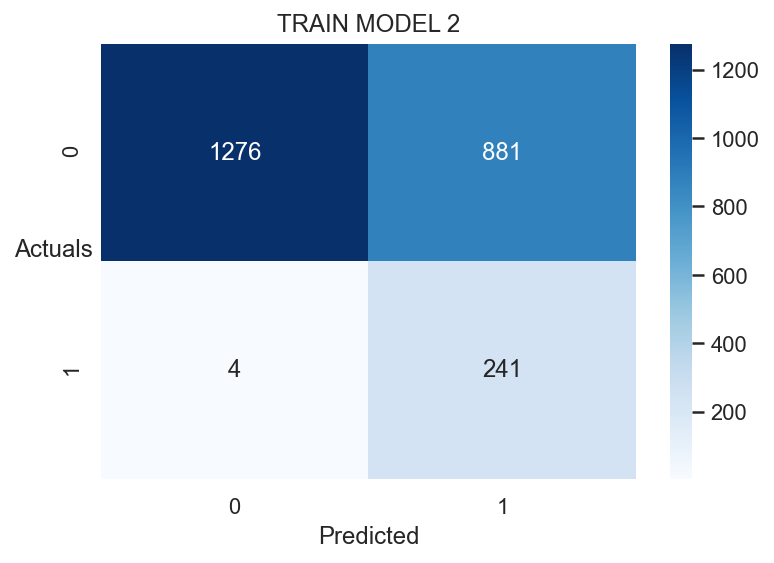

In [104]:
## MODEL 2 TRAIN

y_prob_pred_train = model_2.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 2')

print(metrics.classification_report(y_train,y_class_pred))

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 2')

              precision    recall  f1-score   support

         0.0       1.00      0.54      0.70      1042
         1.0       0.23      0.99      0.37       142

    accuracy                           0.60      1184
   macro avg       0.61      0.77      0.54      1184
weighted avg       0.90      0.60      0.66      1184



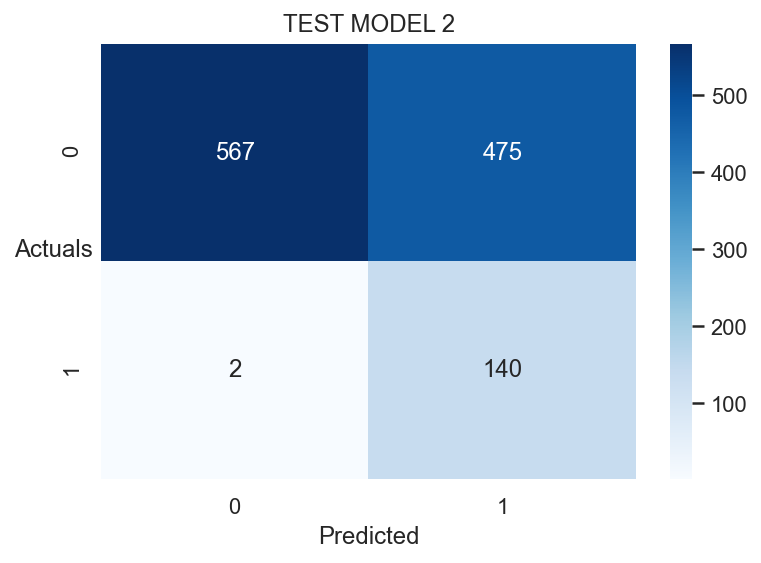

In [105]:
## MODEL 2 TEST

y_prob_pred_test = model_2.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 2')

print(metrics.classification_report(y_test,y_class_pred))

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Import Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns

from scipy.stats import zscore                                        # ZSCORE SCALING
from sklearn.preprocessing import StandardScaler                      # ZScore
from sklearn.preprocessing import MinMaxScaler                        # Min Max Scaler

from sklearn.linear_model import LogisticRegression                   # Logistic Regression

from sklearn import metrics, model_selection                          # Evaluation Metrics
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,accuracy_score,roc_auc_score,roc_curve, precision_recall_curve

from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search


%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('Accent_r')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Load Dataset

In [2]:
df = pd.read_excel('Company_Data2015-1.xlsx')
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Renaming Column Names

In [3]:
df.columns = df.columns.str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('%', 'perc').str.replace('/', '_to_').str.replace('[', '_').str.replace(']', '').str.replace('-', '_')

In [4]:
df['Current_Liabilities_and_Provisions'] = df['Current_Liabilities_and_Provisions_']
df['Total_Assets_to_Liabilities'] = df['Total_Assets_to_Liabilities_']
df['Gross_Block'] = df['Gross_Block_']
df['Net_Working_Capital'] = df['Net_Working_Capital_']
df['Current_Assets'] = df['Current_Assets_']
df['Book_Value_Adj_Unit_Curr'] = df['Book_Value_Adj._Unit_Curr']

In [5]:
df.drop(['Current_Liabilities_and_Provisions_', 'Total_Assets_to_Liabilities_', 'Gross_Block_', 'Net_Working_Capital_', 'Current_Assets_', 'Book_Value_Adj._Unit_Curr'], axis=1, inplace=True)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Basic Exploration

In [6]:
print('Number of Rows(Companies) =', df.shape[0])
print('Number of Columns =', df.shape[1])

Number of Rows(Companies) = 3586
Number of Columns = 67


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth_Next_Year                   3586 non-null   float64
 3   Equity_Paid_Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital_Employed                     3586 non-null   float64
 6   Total_Debt                           3586 non-null   float64
 7   Gross_Sales                          3586 non-null   float64
 8   Net_Sales                            3586 non-null   float64
 9   Other_Income                         3586 non-null   float64
 10  Value_Of_Output                      3586 non-null   float64
 11  Cost_of_Production            

In [8]:
df.head()

,Co_Code,Co_Name,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89


In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.0,16065.388734,19776.817379,4.00,3029.2500,6077.500,24269.5000,72493.00
Networth_Next_Year,3586.0,725.045251,4769.681004,-8021.60,3.9850,19.015,123.8025,111729.10
Equity_Paid_Up,3586.0,62.966584,778.761744,0.00,3.7500,8.290,19.5175,42263.46
Networth,3586.0,649.746299,4091.988792,-7027.48,3.8925,18.580,117.2975,81657.35
Capital_Employed,3586.0,2799.611054,26975.135385,-1824.75,7.6025,39.090,226.6050,714001.25
Total_Debt,3586.0,1994.823779,23652.842746,-0.72,0.0300,7.490,72.3500,652823.81
Gross_Sales,3586.0,1123.738985,10603.703837,-62.59,1.4425,31.210,242.2500,474182.94
Net_Sales,3586.0,1079.702579,9996.574173,-62.59,1.4400,30.440,234.4400,443775.16
Other_Income,3586.0,48.729824,426.040665,-448.72,0.0200,0.450,3.6350,14143.40
Value_Of_Output,3586.0,1077.187292,9843.880293,-119.10,1.4125,30.895,235.8375,435559.09


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Checking Duplicates

In [10]:
print('Number of Duplicates =', df.duplicated().sum().sum())

Number of Duplicates = 0


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dropping Unique Identifiers

Unique Identifiers do not add any value to model building, hence dropping them

In [11]:
df.drop(['Co_Code', 'Co_Name'], axis=1, inplace=True)
df.head()

,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18
2,-3192.58,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14
3,-3054.51,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64
4,-2967.36,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Creating Target/Response Variable

* We consider 'Networth Next Year' as our Default Variable
* SO, we call negative values as Default = 1
* And, positive values as Default = 0

In [12]:
df_orig = df.copy()
df['default'] = np.where(df['Networth_Next_Year']>=0, 0, 1)
df[['default', 'Networth_Next_Year']].head()
df[['default', 'Networth_Next_Year']].tail()

,default,Networth_Next_Year
0,1,-8021.60
1,1,-3986.19
2,1,-3192.58
3,1,-3054.51
4,1,-2967.36


,default,Networth_Next_Year
3581,0,72677.77
3582,0,79162.19
3583,0,88134.31
3584,0,91293.70
3585,0,111729.10


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Dropping variable 'Networth Next Year'

In [13]:
df.drop('Networth_Next_Year', axis=1, inplace=True)
df.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr,default
0,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58,1
1,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18,1
2,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14,1
3,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64,1
4,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89,1


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Missing Value Treatment

In [14]:
print('MISSING VALUES PER VARIABLE -->')
print('')
df.isnull().sum()

MISSING VALUES PER VARIABLE -->



Equity_Paid_Up                           0
Networth                                 0
Capital_Employed                         0
Total_Debt                               0
Gross_Sales                              0
Net_Sales                                0
Other_Income                             0
Value_Of_Output                          0
Cost_of_Production                       0
Selling_Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted_PAT                             0
CP                                       0
Revenue_earnings_in_forex                0
Revenue_expenses_in_forex                0
Capital_expenses_in_forex                0
Book_Value_Unit_Curr                     0
Market_Capitalisation                    0
CEPS_annualised_Unit_Curr                0
Cash_Flow_F

In [15]:
print('PERCENT OF MISSING VALUES TO THE WHOLE DATA --->')
print('')
round(df.isna().sum()*100/df.shape[0], 2)

PERCENT OF MISSING VALUES TO THE WHOLE DATA --->



Equity_Paid_Up                         0.00
Networth                               0.00
Capital_Employed                       0.00
Total_Debt                             0.00
Gross_Sales                            0.00
Net_Sales                              0.00
Other_Income                           0.00
Value_Of_Output                        0.00
Cost_of_Production                     0.00
Selling_Cost                           0.00
PBIDT                                  0.00
PBDT                                   0.00
PBIT                                   0.00
PBT                                    0.00
PAT                                    0.00
Adjusted_PAT                           0.00
CP                                     0.00
Revenue_earnings_in_forex              0.00
Revenue_expenses_in_forex              0.00
Capital_expenses_in_forex              0.00
Book_Value_Unit_Curr                   0.00
Market_Capitalisation                  0.00
CEPS_annualised_Unit_Curr       

* We note that there are not many missing values
* We'll come back to this

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Checking Zero Values

In [16]:
(df.drop('default', axis=1)==0).sum().sort_values(ascending=False)

Capital_expenses_in_forex              2892
ROG_Revenue_earnings_in_forex_perc     2269
Revenue_earnings_in_forex              2230
ROG_Revenue_expenses_in_forex_perc     1971
Revenue_expenses_in_forex              1909
ROG_Market_Capitalisation_perc         1422
Market_Capitalisation                  1249
Inventory_Velocity_Days                1123
Inventory_Ratio_Latest                 1100
Interest_Cover_Ratio_Latest            1001
ROG_Gross_Block_perc                    940
Selling_Cost                            938
Total_Debt                              844
Debtors_Ratio_Latest                    745
Debtors_Velocity_Days                   729
Creditors_Velocity_Days                 704
Other_Income                            690
Cash_Flow_From_Financing_Activities     656
Value_of_Output_to_Gross_Block          611
Fixed_Assets_Ratio_Latest               607
Cash_Flow_From_Investing_Activities     510
Total_Asset_Turnover_Ratio_Latest       493
Value_of_Output_to_Total_Assets 

In [17]:
round(((df.drop('default', axis=1)==0).sum())*100/df.shape[0], 2).sort_values(ascending=False)

Capital_expenses_in_forex              80.65
ROG_Revenue_earnings_in_forex_perc     63.27
Revenue_earnings_in_forex              62.19
ROG_Revenue_expenses_in_forex_perc     54.96
Revenue_expenses_in_forex              53.23
ROG_Market_Capitalisation_perc         39.65
Market_Capitalisation                  34.83
Inventory_Velocity_Days                31.32
Inventory_Ratio_Latest                 30.67
Interest_Cover_Ratio_Latest            27.91
ROG_Gross_Block_perc                   26.21
Selling_Cost                           26.16
Total_Debt                             23.54
Debtors_Ratio_Latest                   20.78
Debtors_Velocity_Days                  20.33
Creditors_Velocity_Days                19.63
Other_Income                           19.24
Cash_Flow_From_Financing_Activities    18.29
Value_of_Output_to_Gross_Block         17.04
Fixed_Assets_Ratio_Latest              16.93
Cash_Flow_From_Investing_Activities    14.22
Total_Asset_Turnover_Ratio_Latest      13.75
Value_of_O

* There are many variables with a lot of zero values
* They may be correct values at times, but also seems like a missing data replaced with zero
* Let us for this analysis, decide to ignore and drop all variables with number of zeros greater than 30%
* We drop the top 9 variables from above

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Dropping Variables with zeros greater than 30%

In [18]:
df.drop(['Capital_expenses_in_forex', 'ROG_Revenue_earnings_in_forex_perc', 'Revenue_earnings_in_forex', 'ROG_Revenue_expenses_in_forex_perc', 'Revenue_expenses_in_forex', 'ROG_Market_Capitalisation_perc', 'Market_Capitalisation', 'Inventory_Velocity_Days', 'Inventory_Ratio_Latest'], axis=1, inplace=True)
df.shape

(3586, 56)

In [19]:
df.columns

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Converting other Zeros to Missing Values for Treatment

In [20]:
df1 = df.drop('default', axis=1)
df1[df1==0] = np.nan
(df1==0).sum()
(df1==0).shape
df1.shape

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

(3586, 55)

(3586, 55)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Visualising Missing Values

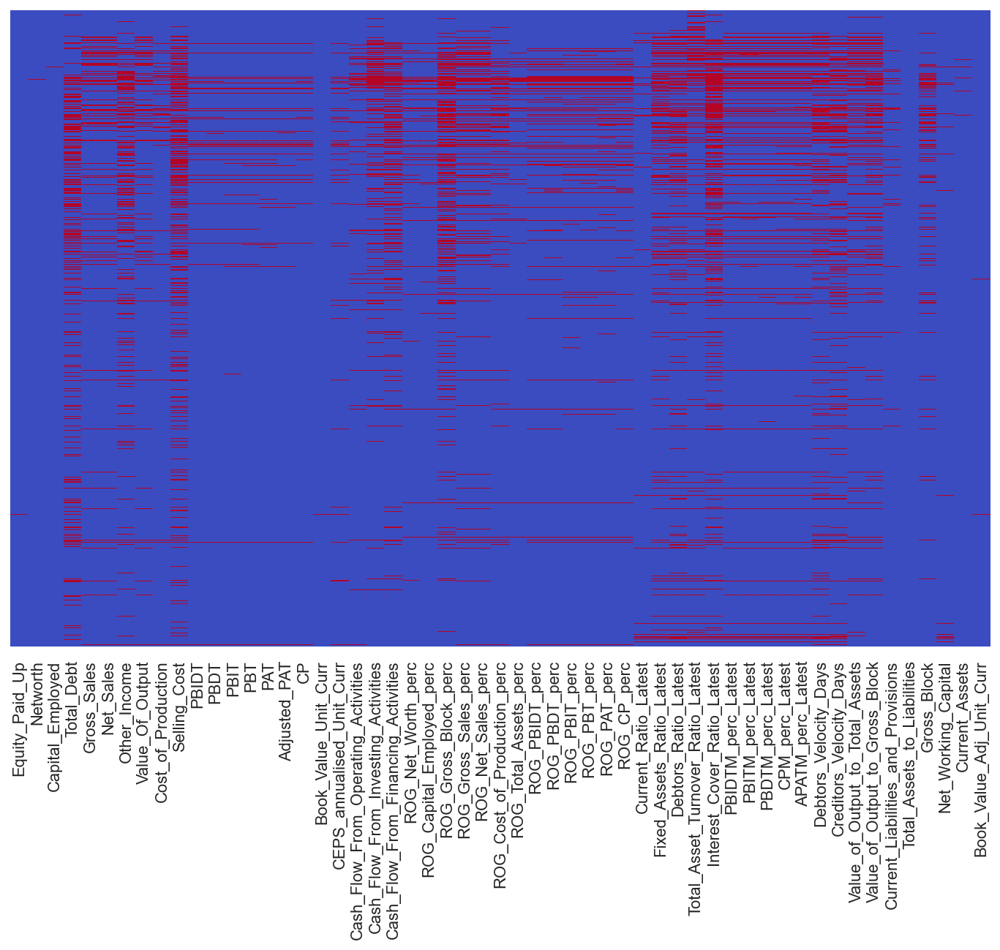

In [21]:
plt.figure(figsize = (12,8))
sns.heatmap(df1.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show();

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Checking Missing Values by Rows

* We check for rows with more than 5 missing values
* Out of these rows, we note that 164 out of 387 defaults exist
* Hence, we ll not drop these rows
* But, also conclude that more the missing or zero values, higher is the probability of default

In [22]:
df1['default'] = df['default']
df_rows = df1[df1.isna().sum(axis=1)>5]
df_rows.shape

(1004, 56)

In [23]:
df1['default'].value_counts()
df_rows['default'].value_counts()

0    3199
1     387
Name: default, dtype: int64

0    840
1    164
Name: default, dtype: int64

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Split Target and Predictor Variables

In [24]:
df_x = df1.drop('default', axis=1)
df_y = df1['default']

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Impute Null Values using KNN Imputer
    n_neighbors=10

In [25]:
df1.isna().sum()

Equity_Paid_Up                            1
Networth                                  3
Capital_Employed                          5
Total_Debt                              844
Gross_Sales                             305
Net_Sales                               306
Other_Income                            690
Value_Of_Output                         290
Cost_of_Production                      159
Selling_Cost                            938
PBIDT                                   102
PBDT                                    108
PBIT                                    109
PBT                                     119
PAT                                     121
Adjusted_PAT                            124
CP                                      111
Book_Value_Unit_Curr                      1
CEPS_annualised_Unit_Curr               139
Cash_Flow_From_Operating_Activities     180
Cash_Flow_From_Investing_Activities     510
Cash_Flow_From_Financing_Activities     656
ROG_Net_Worth_perc              

In [26]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=10)

df_imputed = pd.DataFrame(imputer.fit_transform(df1), columns = df1.columns)

df_imputed.isnull().sum()

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Outlier Treatment using Z-Score method

$z-score$ = $\frac{x - mean}{std. dev}$

We'll cap all values to 3 and -3 which lie beyond them

In [27]:
df_x = df_imputed.drop('default', axis=1)
df_y = df_imputed['default']

In [28]:
sc = StandardScaler()
scaled_x = pd.DataFrame(sc.fit_transform(df_x), columns=df_x.columns)
scaled_x.shape
scaled_x.head()

(3586, 55)

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Book_Value_Unit_Curr,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,0.457700,-1.876422,-0.141144,0.164945,-0.104687,-0.106625,-0.098359,-0.109951,-0.073220,-0.136621,-0.219745,-1.087986,-0.218400,-1.269925,-1.597444,-1.712733,-1.300665,-0.200218,-0.070167,-0.116234,0.088901,0.063686,-0.031174,-0.024154,-0.053997,-0.047697,-0.047683,-0.061476,-0.022530,-0.016883,-0.018319,-0.017542,-0.013260,-0.010295,-0.017847,-0.114195,-0.080782,-0.064401,-0.005841,-0.073199,0.009095,0.019901,0.026778,0.026680,0.026341,-0.064421,-0.048858,-0.003375,-0.062919,0.271003,-0.145930,-0.024689,-0.239493,-0.085048,-0.018786
1,2.429785,-0.884247,0.061494,0.227253,0.166239,0.180775,-0.007957,0.184665,0.195001,0.068248,0.203293,-0.127132,-0.099064,-0.874320,-1.087414,-1.162821,-0.124049,-0.106285,-0.043523,0.390891,-1.031616,0.129995,-0.031439,-0.023940,-0.039885,-0.043602,-0.043588,-0.059370,-0.022273,-0.016883,-0.022694,0.009504,-0.012780,-0.009595,-0.024217,-0.113642,-0.089792,-0.057742,-0.394148,-0.074904,0.025142,0.025454,0.025275,0.025471,0.024367,-0.088268,-0.049809,-0.511823,-0.069802,0.446313,0.372988,1.740220,-0.242617,-0.065275,-0.017597
2,-0.011726,-0.034923,0.182233,0.207572,-0.069530,-0.069321,-0.093800,-0.079357,-0.043384,0.141558,-0.272456,-1.254890,-0.323976,-1.584800,-1.540797,-1.602205,-1.137352,-0.038905,-0.222551,-0.645714,-0.566104,0.924426,-0.032309,-0.023866,-0.045608,-0.057003,-0.056989,-0.074224,-0.022332,-0.024361,-0.038483,-0.027567,-0.027490,-0.034743,-0.062224,-0.104608,-0.090114,-0.077933,-0.399059,-0.078552,-2.906883,-1.760436,-0.679169,-0.689945,-0.603131,-0.081929,-0.041464,-0.799464,-0.070313,1.573817,0.921444,0.141041,0.532734,0.316165,-0.016744
3,0.121144,-0.311197,-0.016526,0.012361,0.021196,0.026919,0.407187,0.027182,0.057797,-0.122041,-0.237143,-0.828601,-0.300023,-1.105950,-1.386042,-1.425234,-0.983034,-0.121361,-0.095508,0.176992,0.111484,-0.333403,-0.041781,-0.024313,-0.045313,-0.043207,-0.043193,-0.058757,-0.022406,-0.025821,-0.022398,-0.037909,-0.016343,-0.014078,-0.022775,-0.113550,-0.082719,-0.059959,-0.280074,-0.073092,0.029020,0.036061,0.026151,0.026408,0.027204,-0.082302,-0.050503,-0.571043,-0.068104,1.216814,0.369183,0.090156,-0.452357,-0.041032,-0.017788
4,-0.016273,-0.420533,0.069545,0.156697,-0.102851,-0.104667,-0.093169,-0.106012,-0.067864,-0.129055,-0.459983,-1.106636,-0.501598,-1.361685,-1.487634,-0.666646,-1.142188,-0.228145,-0.236060,-0.177408,0.174216,0.103833,-0.044441,-0.024083,-0.042976,-0.057780,-0.057766,-0.070447,-0.022372,-0.018820,-0.017215,-0.019453,-0.012187,-0.009059,-0.016554,-0.109770,-0.090085,-0.076184,-0.503690,-0.074611,-0.133595,-0.092190,-0.046619,0.066303,0.053212,0.271397,-0.045336,-0.765624,-0.069996,0.918843,0.502489,0.100526,0.164119,0.120730,-0.019139


In [29]:
for column in df_x.columns:
    lr = -3
    ur = 3
    df_x[column]=np.where(df_x[column]>ur,ur,df_x[column])
    df_x[column]=np.where(df_x[column]<lr,lr,df_x[column])

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6">Correlation Heatmap

<Figure size 2880x2880 with 0 Axes>

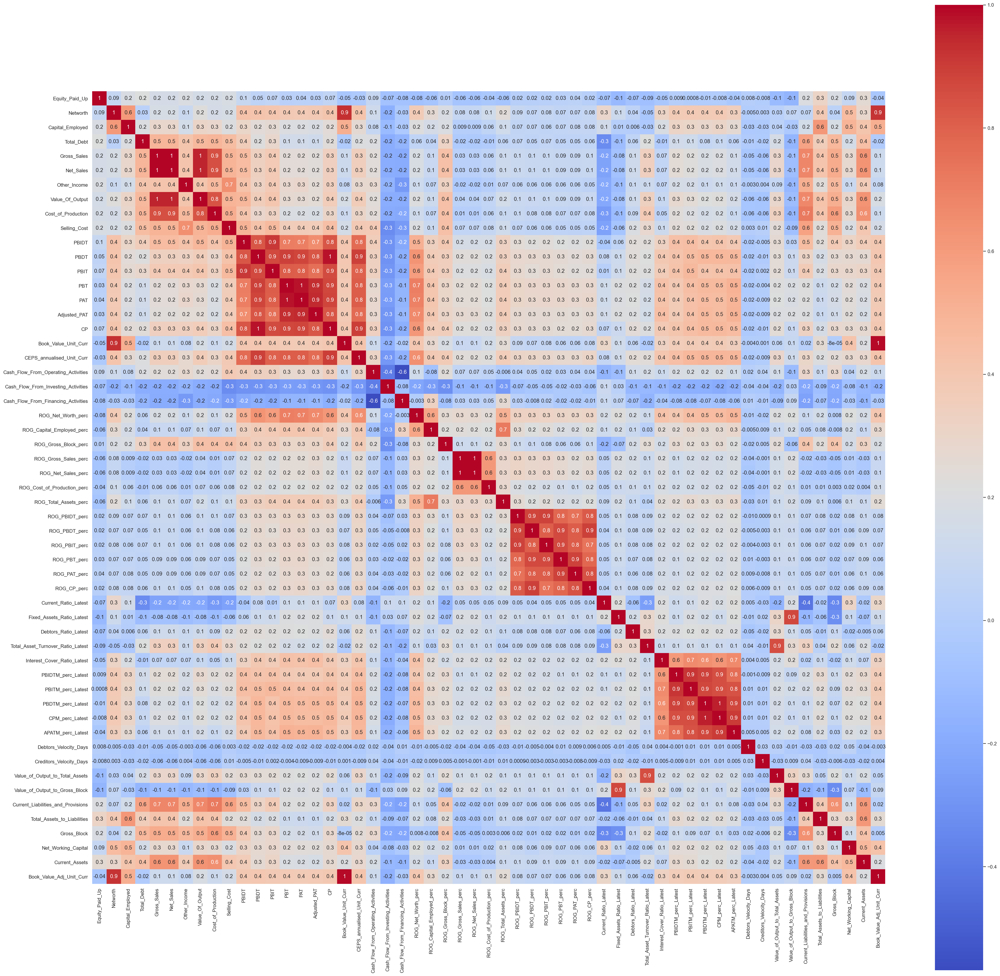

In [30]:
#calculate column correlations and make a seaborn heatmap - Before standardisation

plt.figure(figsize=(40,40))
p=sns.heatmap(df_x.corr(), annot=True,cmap='coolwarm',square=True, fmt='.1g')

* We see a lot of red patches showing high correlation between variables
* This gives rise to issues of Multi-Collinearity
* Lets check for Multi-Collinearity using Variance Inflation Factor

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Check Multi-Colinearity using Variance Inflation Factor

In [31]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [32]:
X = df_x.copy()
f = calc_vif(X).sort_values(by = 'VIF', ascending = False)
f

,variables,VIF
5,Net_Sales,91096.145862
4,Gross_Sales,90763.926316
17,Book_Value_Unit_Curr,201.523094
54,Book_Value_Adj_Unit_Curr,189.628506
45,Debtors_Velocity_Days,140.189690
46,Creditors_Velocity_Days,136.567955
25,ROG_Gross_Sales_perc,106.347196
26,ROG_Net_Sales_perc,106.298466
7,Value_Of_Output,73.148662
50,Total_Assets_to_Liabilities,65.545310


In [33]:
X.shape
X.columns

(3586, 55)

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dropping Variables recursively with VIF greater than 5

* We check VIF of all predictor variables
* We arrange these variables in decreasing order of VIF
* We check if the top variable has VIF > 5
* If yes, then we drop ONLY this Top Variable and check for VIF again
* We run this in a loop and drop variables one by one till we get max VIF < 5

In [34]:
import time
start = time.time()

for i in range(55):
    v = calc_vif(X).sort_values(by = 'VIF', ascending = False)
    if (v.iloc[0,1] > 5):
        X = X.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Time taken = 17.34569501876831


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Check VIF again

In [35]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)


,variables,VIF
20,Value_of_Output_to_Gross_Block,4.841672
16,Current_Ratio_Latest,4.496532
1,Selling_Cost,4.155857
22,Book_Value_Adj_Unit_Curr,4.081417
2,PBIDT,3.996385
13,ROG_PBIDT_perc,3.898672
15,ROG_CP_perc,3.649697
0,Other_Income,3.464304
14,ROG_PBT_perc,3.158321
21,Net_Working_Capital,2.973412


In [36]:
X.shape
X.head()

(3586, 23)

,Other_Income,Selling_Cost,PBIDT,Adjusted_PAT,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,ROG_CP_perc,Current_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr
0,3.0,0.492,-3.0,-3.0,-3.0,1.46,3.0,-3.0,-3.0,-3.00,-3.0,1.38,-3.00,3.0,-3.00,-3.00,0.02,-0.20,-3.0,0.911,3.00,-3.0,-3.0
1,3.0,3.000,3.0,-3.0,3.0,-3.00,3.0,-3.0,3.0,3.00,3.0,3.00,3.00,3.0,-3.00,-3.00,0.08,-0.84,-3.0,0.310,0.24,-3.0,-3.0
2,3.0,3.000,-3.0,-3.0,-3.0,-3.00,3.0,-3.0,3.0,-2.07,-3.0,-3.00,-0.78,-3.0,-3.00,-3.00,1.06,-2.21,-3.0,-0.030,-0.26,3.0,3.0
3,3.0,3.000,-3.0,-3.0,3.0,3.00,-3.0,-3.0,-3.0,-1.80,3.0,3.00,-3.00,-3.0,-3.00,-3.00,0.09,-0.16,-3.0,0.240,1.90,-3.0,-3.0
4,3.0,1.970,-3.0,-3.0,-3.0,3.00,3.0,-3.0,-3.0,0.34,-3.0,-3.00,-3.00,-3.0,1.87,-1.13,0.50,-0.73,3.0,0.010,0.05,3.0,-3.0


* After dropping variables one by one with high VIF (>5)
* We are left with final 23 predictor variables for modelling

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Split the whole data into Train and Test 67-33

In [37]:

X_train, X_test, y_train, y_test = train_test_split(X, df_y, 
                                                    test_size = 0.33, random_state=42)

In [38]:
X.shape
df_y.shape

(3586, 23)

(3586,)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Logistic Regression using StatsModel

### <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#02A3FF"> MODEL 3

In [39]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_3 = SM.Logit(y_train, X_train).fit()
print(model_3.summary())

Optimization terminated successfully.
         Current function value: 0.065853
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2379
Method:                           MLE   Df Model:                           22
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                  0.8001
Time:                        14:58:42   Log-Likelihood:                -158.18
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                3.040e-254
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Other_Income                           -0.0754      0.156

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Metrics of Model 3

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TRAIN MODEL 3')

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2157
         1.0       0.92      0.85      0.89       245

    accuracy                           0.98      2402
   macro avg       0.95      0.92      0.94      2402
weighted avg       0.98      0.98      0.98      2402



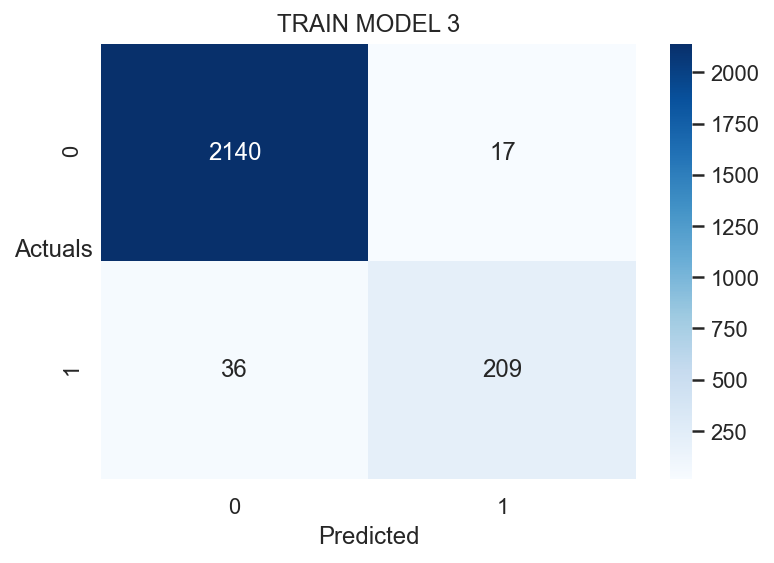

In [40]:
## MODEL 3 TRAIN

y_prob_pred_train = model_3.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 3')

print(metrics.classification_report(y_train,y_class_pred))

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 1')

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      1042
         1.0       0.90      0.88      0.89       142

    accuracy                           0.97      1184
   macro avg       0.94      0.93      0.94      1184
weighted avg       0.97      0.97      0.97      1184



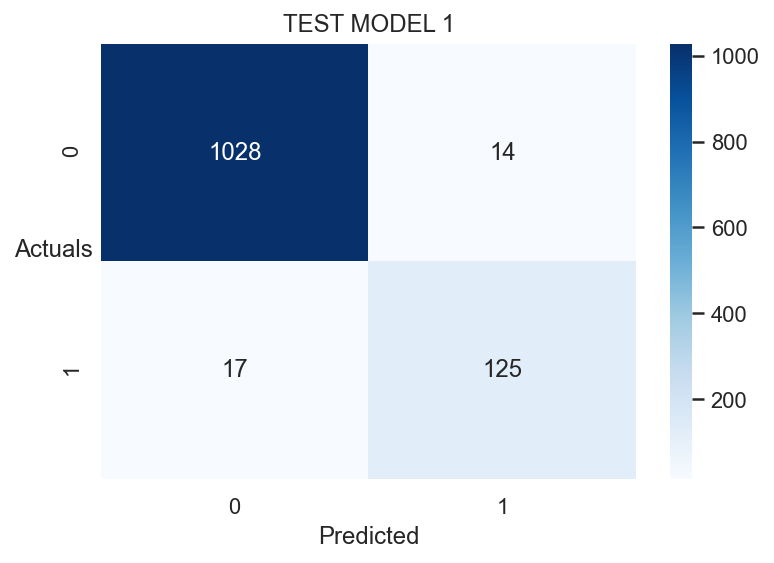

In [41]:
## MODEL 3 TEST

y_prob_pred_test = model_3.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 1')

print(metrics.classification_report(y_test,y_class_pred))

In [42]:
X_test.shape

(1184, 23)

### <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#02A3FF"> MODEL 4

In [43]:

X_train, X_test, y_train, y_test = train_test_split(X, df_y, 
                                                    test_size = 0.33, random_state=42)

In [44]:
v = pd.DataFrame(model_3.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
v

,index,pvalue
0,Cash_Flow_From_Investing_Activities,9.629923e-01
1,Cash_Flow_From_Financing_Activities,9.406686e-01
2,Value_of_Output_to_Gross_Block,9.193957e-01
3,ROG_PBT_perc,8.195509e-01
4,Cash_Flow_From_Operating_Activities,7.197220e-01
5,Adjusted_PAT,7.040353e-01
6,Net_Working_Capital,6.915001e-01
7,ROG_Net_Sales_perc,6.674742e-01
8,Other_Income,6.285819e-01
9,ROG_Cost_of_Production_perc,5.109167e-01


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Dropping Variables recursively with p-values greater than 0.05

* We check p-values of all predictor variables
* We arrange these variables in decreasing order of p-values
* We check if the top predictor variable has p-value > 0.05
* If yes, then it means that this variable is not significant in predicting default at 95% Confidence
* Hence, we drop ONLY this Top Variable and check for p-values again
* We run this in a loop and drop variables one by one till we get all p-values < 0.05

In [45]:
import time
start = time.time()

for i in range(23):
    model_4 = SM.Logit(y_train, X_train).fit()
    v = pd.DataFrame(model_4.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v.iloc[0,1] > 0.05):
        X_train = X_train.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.065853
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065854
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065854
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065857
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065867
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065899
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065927
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065967
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.066029
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Check p-values again

In [46]:
print(model_4.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2393
Method:                           MLE   Df Model:                            8
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                  0.7938
Time:                        14:58:43   Log-Likelihood:                -163.20
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                6.562e-266
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Selling_Cost                    0.3771      0.133      2.845      0.004       0.117       0.637
PBIDT                          -0.2783      0.082     -3.389      0.001      -0.

* We note that only those variables are included in the model which p-values less than 0.05
* All other variables with p-values > 0.05 are recursively dropped one by one

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Re-setting the Test set with only the required 9 variables chosen

In [47]:
X_train.shape

(2402, 9)

In [48]:
y_train.shape

(2402,)

In [49]:
X_test = X_test[X_train.columns]

In [50]:
X_test.shape

(1184, 9)

In [51]:
X_test.columns

Index(['Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Total_Assets_perc', 'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Book_Value_Adj_Unit_Curr'], dtype='object')

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Metrics of Model 4

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TRAIN MODEL 4')

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2157
         1.0       0.92      0.85      0.88       245

    accuracy                           0.98      2402
   macro avg       0.95      0.92      0.94      2402
weighted avg       0.98      0.98      0.98      2402



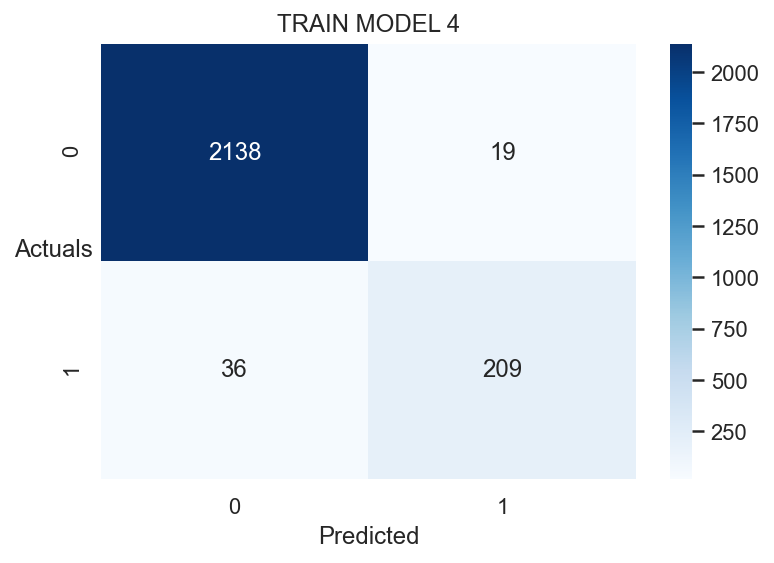

In [52]:
## MODEL 4 TRAIN

y_prob_pred_train = model_4.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 4')

print(metrics.classification_report(y_train,y_class_pred))

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 4')

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1042
         1.0       0.89      0.88      0.88       142

    accuracy                           0.97      1184
   macro avg       0.94      0.93      0.93      1184
weighted avg       0.97      0.97      0.97      1184



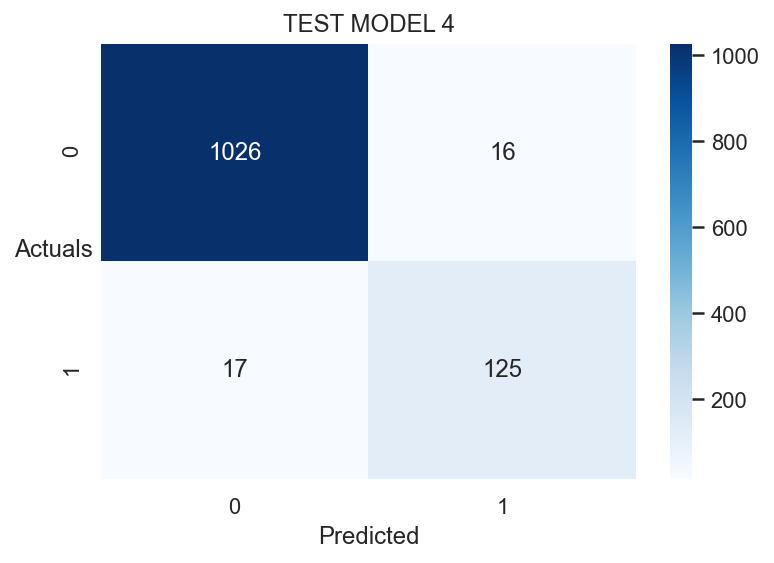

In [53]:
## MODEL 4 TEST

y_prob_pred_test = model_4.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 4')

print(metrics.classification_report(y_test,y_class_pred))

* Model 3 has the best metrics
* But, Model 4 is also just slightly behind
* But majorly, Model 4 has only 9 predictors versus 23 of Model 3
* Hence, lets decide to continue with more analysis on Model 4

In [54]:
X_train.shape

(2402, 9)

In [55]:
final_cols = X_train.columns
final_cols

Index(['Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Total_Assets_perc', 'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Book_Value_Adj_Unit_Curr'], dtype='object')

In [56]:
data = pd.concat([X_train, y_train], axis=1)
data1 = pd.concat([X_test, y_test], axis=1)
data.shape
data1.shape

(2402, 10)

(1184, 10)

In [57]:
final_data = pd.concat([data, data1], axis=0)
final_data.shape

(3586, 10)

In [58]:
final_data.to_csv('final_data.csv')
final_data.to_excel('final_data.xlsx')

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Model 5

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#00B1C6"> Logistic Regression - Fine Tuning by using GridSearchCV

In [59]:
X_train.shape

(2402, 9)

In [60]:
grid={'penalty':['l2','none', 'l1'],
      'solver':['lbfgs', 'liblinear', 'sag', 'saga', 'newton-cg'],
      'tol':[0.0001,0.00001]}

In [61]:
model = LogisticRegression(max_iter=10000,n_jobs=2)

In [62]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 10,n_jobs=-1,scoring='f1', verbose=True)

In [63]:
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 293 out of 300 | elapsed:    9.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    9.9s finished


GridSearchCV(cv=10, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none', 'l1'],
                         'solver': ['lbfgs', 'liblinear', 'sag', 'saga',
                                    'newton-cg'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1', verbose=True)

In [64]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'none', 'solver': 'lbfgs', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=2, penalty='none')


In [65]:
best_model = grid_search.best_estimator_

In [66]:
logit4_train_score = best_model.score(X_train, y_train)
logit4_test_score = best_model.score(X_test, y_test)
logit4_test_f1 = metrics.f1_score(y_test, best_model.predict(X_test))
logit4_test_f0 = metrics.f1_score(y_test, best_model.predict(X_test), pos_label=0)

print('Regularised Logistic Regression Train Score =', round(logit4_train_score, 4))
print('Regularised Logistic Regression Test Score =', round(logit4_test_score, 4))
print('Regularised Logistic Regression f1 Test Score for "1" =', round(logit4_test_f1, 4))
print('Regularised Logistic Regression f1 Test Score for "0" =', round(logit4_test_f0, 4))

Regularised Logistic Regression Train Score = 0.9771
Regularised Logistic Regression Test Score = 0.9721
Regularised Logistic Regression f1 Test Score for "1" = 0.8834
Regularised Logistic Regression f1 Test Score for "0" = 0.9842


In [67]:
print('TEST REGULARISED MODEL')
print('')
print(metrics.classification_report(y_test, best_model.predict(X_test)))

TEST REGULARISED MODEL

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1042
         1.0       0.89      0.88      0.88       142

    accuracy                           0.97      1184
   macro avg       0.94      0.93      0.93      1184
weighted avg       0.97      0.97      0.97      1184



### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Model 6

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Choosing Optimal Threshold for Model 4

In [68]:
X_train.shape

(2402, 9)

In [69]:
from sklearn.metrics import roc_curve

y_prob_pred_train = model_4.predict(X_train)
fpr, tpr, thresholds = roc_curve(y_train,y_prob_pred_train)

In [70]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.08409205000274865

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TRAIN MODEL 6')

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      2157
         1.0       0.71      0.95      0.81       245

    accuracy                           0.95      2402
   macro avg       0.85      0.95      0.89      2402
weighted avg       0.96      0.95      0.96      2402



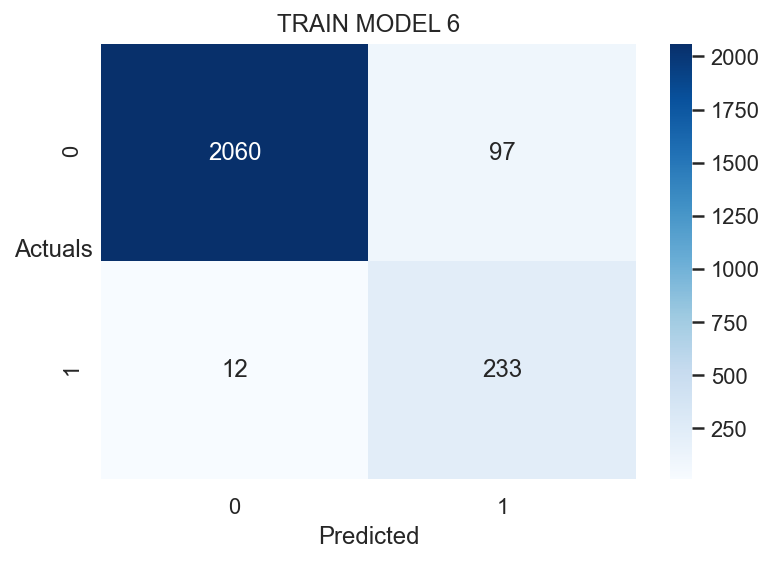

In [71]:
## MODEL 6 TRAIN

y_prob_pred_train = model_4.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>optimal_threshold:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 6')

print(metrics.classification_report(y_train,y_class_pred))

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 6')

              precision    recall  f1-score   support

         0.0       0.99      0.95      0.97      1042
         1.0       0.71      0.95      0.81       142

    accuracy                           0.95      1184
   macro avg       0.85      0.95      0.89      1184
weighted avg       0.96      0.95      0.95      1184



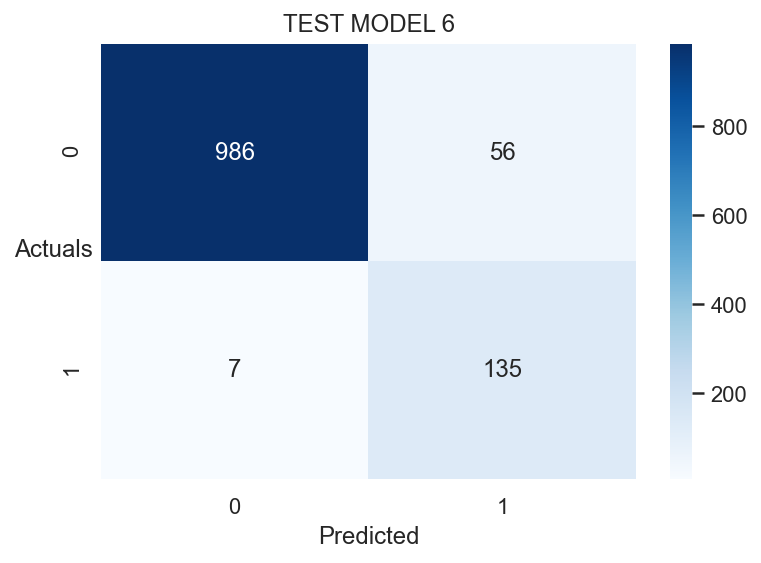

In [72]:
## MODEL 6 TEST

y_prob_pred_test = model_4.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>optimal_threshold:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 6')

print(metrics.classification_report(y_test,y_class_pred))

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Model 7

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Using Recursive Feature Elimination Method to choose features

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, df_y, 
                                                    test_size = 0.33, random_state=42)


#### For modeling we will use Logistic Regression with recursive feature elimination
from sklearn.feature_selection import RFE

LogR = LogisticRegression()

selector = RFE(estimator = LogR, n_features_to_select=15, step=1)

selector = selector.fit(X_train, y_train)

df = pd.DataFrame({'Feature': X.columns, 'Rank': selector.ranking_})

In [74]:
df.sort_values(by='Rank')

,Feature,Rank
0,Other_Income,1
20,Value_of_Output_to_Gross_Block,1
19,Value_of_Output_to_Total_Assets,1
18,APATM_perc_Latest,1
17,Interest_Cover_Ratio_Latest,1
16,Current_Ratio_Latest,1
15,ROG_CP_perc,1
13,ROG_PBIDT_perc,1
12,ROG_Total_Assets_perc,1
22,Book_Value_Adj_Unit_Curr,1


In [75]:
pred_train = selector.predict(X_train)
pred_test = selector.predict(X_test)

print(confusion_matrix(y_train, pred_train))

print(classification_report(y_train, pred_train))

[[2140   17]
 [  33  212]]
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2157
         1.0       0.93      0.87      0.89       245

    accuracy                           0.98      2402
   macro avg       0.96      0.93      0.94      2402
weighted avg       0.98      0.98      0.98      2402



In [76]:
print(confusion_matrix(y_test, pred_test))

print(classification_report(y_test, pred_test))

[[1026   16]
 [  18  124]]
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1042
         1.0       0.89      0.87      0.88       142

    accuracy                           0.97      1184
   macro avg       0.93      0.93      0.93      1184
weighted avg       0.97      0.97      0.97      1184



### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Model 8

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Using SMOTE to Balance the target Variable 'default'

We use SMOTE on Model 7 - RFE

In [147]:

df = df[df['Rank'] == 1]

l = df['Feature'].values
list(l)

X = X[l]
X.columns
X.shape

['Other_Income',
 'Selling_Cost',
 'PBIDT',
 'ROG_Net_Worth_perc',
 'ROG_Capital_Employed_perc',
 'ROG_Gross_Block_perc',
 'ROG_Total_Assets_perc',
 'ROG_PBIDT_perc',
 'ROG_CP_perc',
 'Current_Ratio_Latest',
 'Interest_Cover_Ratio_Latest',
 'APATM_perc_Latest',
 'Value_of_Output_to_Total_Assets',
 'Value_of_Output_to_Gross_Block',
 'Book_Value_Adj_Unit_Curr']

Index(['Other_Income', 'Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Value_of_Output_to_Total_Assets', 'Value_of_Output_to_Gross_Block', 'Book_Value_Adj_Unit_Curr'], dtype='object')

(3586, 15)

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X, df_y, 
                                                    test_size = 0.33, random_state=42)

In [149]:
X_train.shape

(2402, 15)

In [150]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=33)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [151]:
selector_smote = selector.fit(X_res, y_res)

In [152]:
selector_smote.n_features_


15

In [153]:
smote_model8 = pd.DataFrame({'Feature': X_train.columns, 'Rank': selector_smote.ranking_})
smote_model8 = smote_model8[smote_model8['Rank'] == 1]
smote_model8

,Feature,Rank
0,Other_Income,1
1,Selling_Cost,1
2,PBIDT,1
3,ROG_Net_Worth_perc,1
4,ROG_Capital_Employed_perc,1
5,ROG_Gross_Block_perc,1
6,ROG_Total_Assets_perc,1
7,ROG_PBIDT_perc,1
8,ROG_CP_perc,1
9,Current_Ratio_Latest,1


In [154]:
smote_model8.to_csv('smote_model8.csv')

In [155]:
l = smote_model8['Feature'].values
list(l)
l

['Other_Income',
 'Selling_Cost',
 'PBIDT',
 'ROG_Net_Worth_perc',
 'ROG_Capital_Employed_perc',
 'ROG_Gross_Block_perc',
 'ROG_Total_Assets_perc',
 'ROG_PBIDT_perc',
 'ROG_CP_perc',
 'Current_Ratio_Latest',
 'Interest_Cover_Ratio_Latest',
 'APATM_perc_Latest',
 'Value_of_Output_to_Total_Assets',
 'Value_of_Output_to_Gross_Block',
 'Book_Value_Adj_Unit_Curr']

array(['Other_Income', 'Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc',
       'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc',
       'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_CP_perc',
       'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest',
       'APATM_perc_Latest', 'Value_of_Output_to_Total_Assets',
       'Value_of_Output_to_Gross_Block', 'Book_Value_Adj_Unit_Curr'],
      dtype=object)

In [156]:
data15 = X[l]
data15['default'] = df_y
data15_orig = df_imputed[l]
data15_orig['default'] = df_y

data15.to_csv('data15.csv')
data15_orig.to_csv('data15_orig.csv')

In [157]:
df_orig_new = df_orig.copy()
df_orig_new = df_orig_new[l]
df_orig_new['default'] = df_y
df_orig_new.to_csv('df_orig15.csv')

In [158]:
pred_train_smote = selector_smote.predict(X_res)
pred_test_smote = selector_smote.predict(X_test)

In [159]:
print(classification_report(y_res, pred_train_smote))

              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97      2157
         1.0       0.97      0.96      0.97      2157

    accuracy                           0.97      4314
   macro avg       0.97      0.97      0.97      4314
weighted avg       0.97      0.97      0.97      4314



In [160]:
print(classification_report(y_test, pred_test_smote))

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      1042
         1.0       0.78      0.95      0.86       142

    accuracy                           0.96      1184
   macro avg       0.89      0.96      0.92      1184
weighted avg       0.97      0.96      0.96      1184



In [162]:
X_res.shape
y_res.shape

(4314, 15)

(4314,)

In [163]:
X_test.shape
y_test.shape

(1184, 15)

(1184,)

In [164]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_8 = SM.Logit(y_res, X_res).fit()
print(model_8.summary())



Optimization terminated successfully.
         Current function value: 0.098486
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4299
Method:                           MLE   Df Model:                           14
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                  0.8579
Time:                        15:59:58   Log-Likelihood:                -424.87
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Other_Income                        0.3180      0.101      3.145  

In [146]:
LRresult1 = (model_8.summary().tables[1])
LRresult1 = pd.DataFrame(LRresult1)
LRresult1.to_csv('model_8_summary.csv')

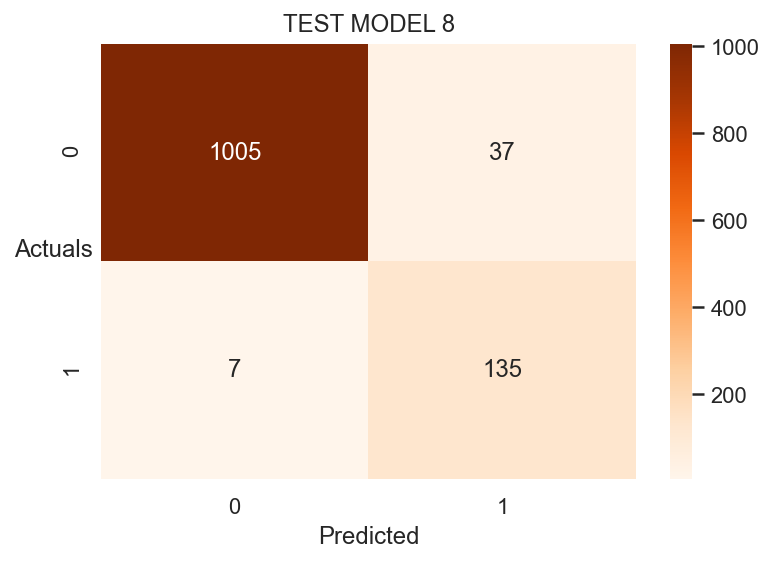

In [168]:
## MODEL 8 TEST

sns.heatmap((metrics.confusion_matrix(y_test,pred_test_smote)),annot=True,fmt='.5g'
            ,cmap='Oranges');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 8')
plt.savefig('model8_cm.jpg', bbox_inches='tight');


In [169]:
print(metrics.classification_report(y_test,pred_test_smote))

cr = classification_report(y_test, pred_test_smote, output_dict=True)
cr = pd.DataFrame(cr).T
cr.to_csv('cr.csv')

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      1042
         1.0       0.78      0.95      0.86       142

    accuracy                           0.96      1184
   macro avg       0.89      0.96      0.92      1184
weighted avg       0.97      0.96      0.96      1184



### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Model 9

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#9B59B6"> Using SMOTE to Balance the target Variable 'default' and Choosing Optimal Threshold

In [97]:
selector_smote.predict_proba(X_res)

array([[9.89099942e-01, 1.09000581e-02],
       [9.99459901e-01, 5.40099233e-04],
       [9.25872325e-01, 7.41276754e-02],
       ...,
       [3.25320052e-02, 9.67467995e-01],
       [8.21928397e-05, 9.99917807e-01],
       [1.22675352e-03, 9.98773246e-01]])

In [98]:
from sklearn.metrics import roc_curve

y_prob_pred_train = selector_smote.predict_proba(X_res)[:,1]
y_prob_pred_test = selector_smote.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_res,y_prob_pred_train)

In [99]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.4246321187559892

In [100]:
y_prob_pred_test

array([0.01127219, 0.00159853, 0.20162513, ..., 0.01332857, 0.00097907,
       0.00378365])

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 9')

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      1042
         1.0       0.75      0.95      0.84       142

    accuracy                           0.96      1184
   macro avg       0.87      0.95      0.90      1184
weighted avg       0.96      0.96      0.96      1184



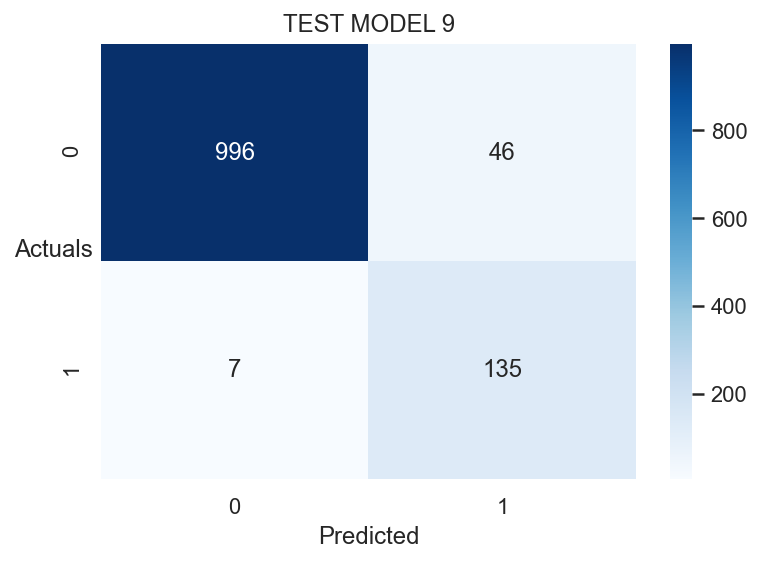

In [101]:


y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>optimal_threshold:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 9')

print(metrics.classification_report(y_test,y_class_pred))

In [102]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_9 = SM.Logit(y_res, X_res).fit()
print(model_9.summary())


Optimization terminated successfully.
         Current function value: 0.098486
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4299
Method:                           MLE   Df Model:                           14
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                  0.8579
Time:                        15:08:37   Log-Likelihood:                -424.87
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Other_Income                        0.3180      0.101      3.145  

In [103]:
LRresult = (model_9.summary().tables[1])
LRresult = pd.DataFrame(LRresult)
LRresult.to_csv('model_9_summary.csv')
LRresult

,0,1,2,3,4,5,6
0,,coef,std err,z,P>|z|,[0.025,0.975]
1,Other_Income,0.3180,0.101,3.145,0.002,0.120,0.516
2,Selling_Cost,0.6835,0.119,5.754,0.000,0.451,0.916
3,PBIDT,-0.3132,0.056,-5.553,0.000,-0.424,-0.203
4,ROG_Net_Worth_perc,-0.4148,0.049,-8.388,0.000,-0.512,-0.318
5,ROG_Capital_Employed_perc,0.4119,0.054,7.656,0.000,0.306,0.517
6,ROG_Gross_Block_perc,0.0368,0.047,0.790,0.429,-0.055,0.128
7,ROG_Total_Assets_perc,-0.2154,0.055,-3.939,0.000,-0.323,-0.108
8,ROG_PBIDT_perc,0.2171,0.057,3.835,0.000,0.106,0.328
9,ROG_CP_perc,-0.1513,0.057,-2.677,0.007,-0.262,-0.041


In [104]:
import time
start = time.time()

for i in range(23):
    model_10 = SM.Logit(y_res, X_res).fit()
    v = pd.DataFrame(model_10.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v.iloc[0,1] > 0.05):
        X_res = X_res.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.098486
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098510
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
  

In [105]:
print(model_10.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4301
Method:                           MLE   Df Model:                           12
Date:                Sun, 20 Jun 2021   Pseudo R-squ.:                  0.8578
Time:                        15:08:37   Log-Likelihood:                -425.23
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Other_Income                       0.3276      0.100      3.278      0.001       0.132       0.523
Selling_Cost                       0.6835      0.115      5.937      0.

In [123]:
LRresult1 = (model_10.summary().tables[1])
LRresult1 = pd.DataFrame(LRresult1)
# LRresult1.to_csv('model_9_summary.csv')


In [127]:
X_test.drop(['Value_of_Output_to_Total_Assets', 'ROG_Gross_Block_perc'], axis=1, inplace=True)
X_test.shape

(1184, 13)

<AxesSubplot:>

Text(0.5, 12.5, 'Predicted')

Text(30.5, 0.5, 'Actuals')

Text(0.5, 1.0, 'TEST MODEL 4')

              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      1042
         1.0       0.78      0.92      0.85       142

    accuracy                           0.96      1184
   macro avg       0.89      0.94      0.91      1184
weighted avg       0.96      0.96      0.96      1184



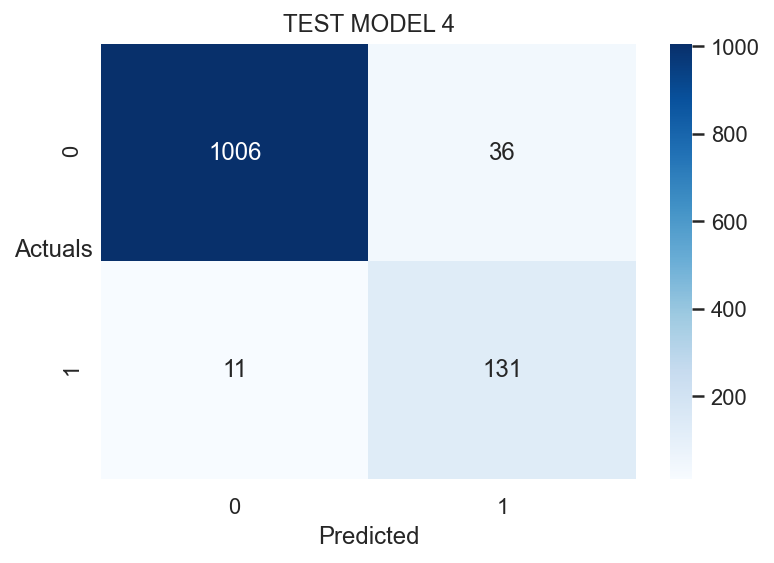

In [128]:
## MODEL 10 TEST

y_prob_pred_test = model_10.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 4')

print(metrics.classification_report(y_test,y_class_pred))

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns

from scipy.stats import zscore                                        # ZSCORE SCALING
from sklearn.preprocessing import StandardScaler                      # ZScore
from sklearn.preprocessing import MinMaxScaler                        # Min Max Scaler

from sklearn.linear_model import LogisticRegression                   # Logistic Regression

from sklearn import metrics, model_selection                          # Evaluation Metrics
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,accuracy_score,roc_auc_score,roc_curve, precision_recall_curve

from sklearn.model_selection import train_test_split, GridSearchCV    # Train test Split and Grid Search


%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('pastel')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

In [8]:
comp = pd.read_csv('df_orig15.csv')
scaled_comp = pd.read_csv('data15.csv')

In [9]:
comp.drop('Unnamed: 0', axis=1, inplace=True)
scaled_comp.drop('Unnamed: 0', axis=1, inplace=True)
comp.head()

,Selling_Cost,PBIDT,Cash_Flow_From_Operating_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,ROG_CP_perc,Current_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Value_of_Output_to_Total_Assets,Net_Working_Capital,Book_Value_Adj_Unit_Curr,default
0,0.00,-179.06,-102.47,-15.31,-20.76,-25.75,5.23,-19.33,-19.29,0.02,-0.20,0.00,0.00,-1076.34,-167.58,1.0
1,40.51,646.46,635.91,-26.15,6.30,6.66,5.24,-9.85,-108.77,0.08,-0.84,-87.18,0.31,-1098.88,-15.18,1.0
2,54.83,-281.92,-873.40,-61.86,15.66,-0.78,-169.69,-300.41,-642.67,1.06,-2.21,-7961.51,-0.03,4496.25,94.14,1.0
3,3.34,-213.01,324.47,-450.67,-40.84,-10.12,-203.84,-80.23,-88.52,0.09,-0.16,-51.58,0.24,-2612.42,-39.64,1.0
4,1.97,-647.86,-191.54,-559.83,-11.76,-5.81,-40.07,1.87,-1.13,0.50,-0.73,274.79,0.01,1836.23,-212.89,1.0


In [10]:
scaled_comp.head()

,Selling_Cost,PBIDT,Cash_Flow_From_Operating_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,ROG_CP_perc,Current_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Value_of_Output_to_Total_Assets,Net_Working_Capital,Book_Value_Adj_Unit_Curr,default
0,0.492,-3.0,-3.0,-3.0,-3.0,-3.00,3.0,-3.00,-3.00,0.02,-0.20,-3.0,0.911,-3.0,-3.0,1.0
1,3.000,3.0,3.0,-3.0,3.0,3.00,3.0,-3.00,-3.00,0.08,-0.84,-3.0,0.310,-3.0,-3.0,1.0
2,3.000,-3.0,-3.0,-3.0,3.0,-0.78,-3.0,-3.00,-3.00,1.06,-2.21,-3.0,-0.030,3.0,3.0,1.0
3,3.000,-3.0,3.0,-3.0,-3.0,-3.00,-3.0,-3.00,-3.00,0.09,-0.16,-3.0,0.240,-3.0,-3.0,1.0
4,1.970,-3.0,-3.0,-3.0,-3.0,-3.00,-3.0,1.87,-1.13,0.50,-0.73,3.0,0.010,3.0,-3.0,1.0


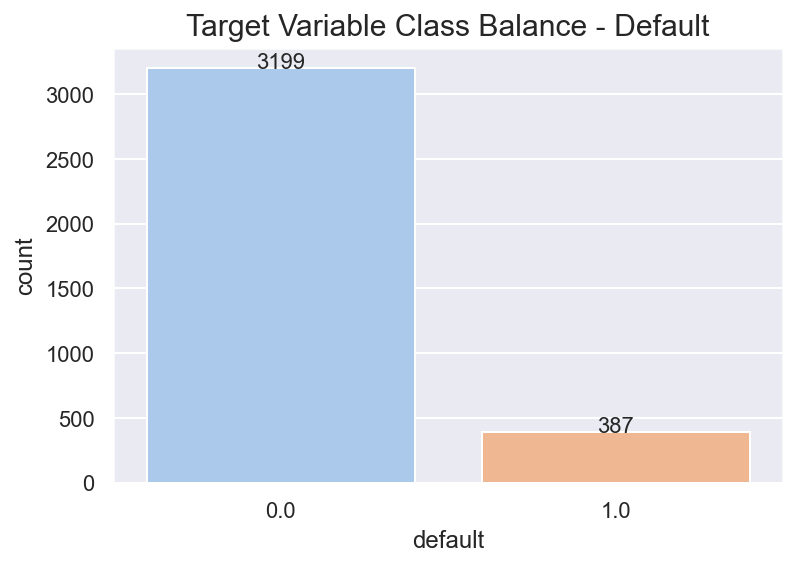

In [11]:
countplt, ax = plt.subplots()
ax =sns.countplot(comp['default'] );


# show count (+ annotate)
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.75,rect.get_height(),horizontalalignment='center', fontsize = 11)
countplt

plt.title('Target Variable Class Balance - Default', fontsize=15);

plt.savefig('default_count.jpg', bbox_inches='tight');

<AxesSubplot:xlabel='default', ylabel='Book_Value_Adj_Unit_Curr'>

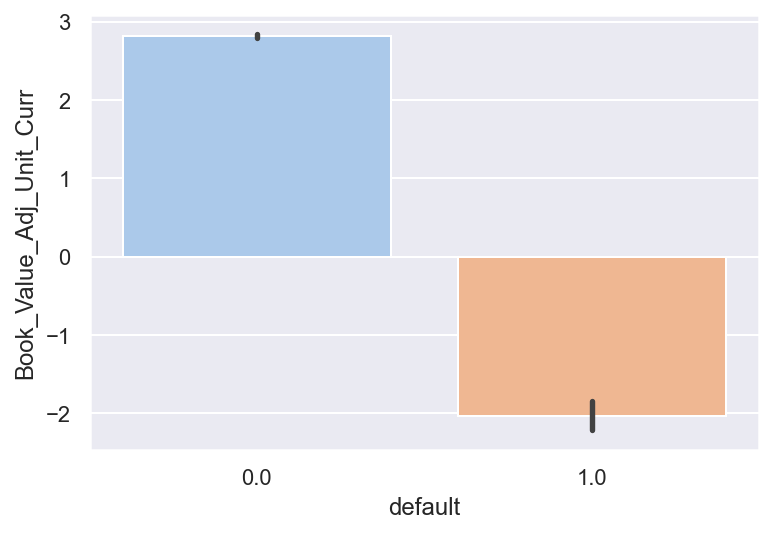

In [12]:
temp=scaled_comp.drop('default', axis=1)
sns.barplot(x=scaled_comp['default'], y=scaled_comp['Book_Value_Adj_Unit_Curr'])

In [13]:
grp_sc = scaled_comp.groupby('default').mean()

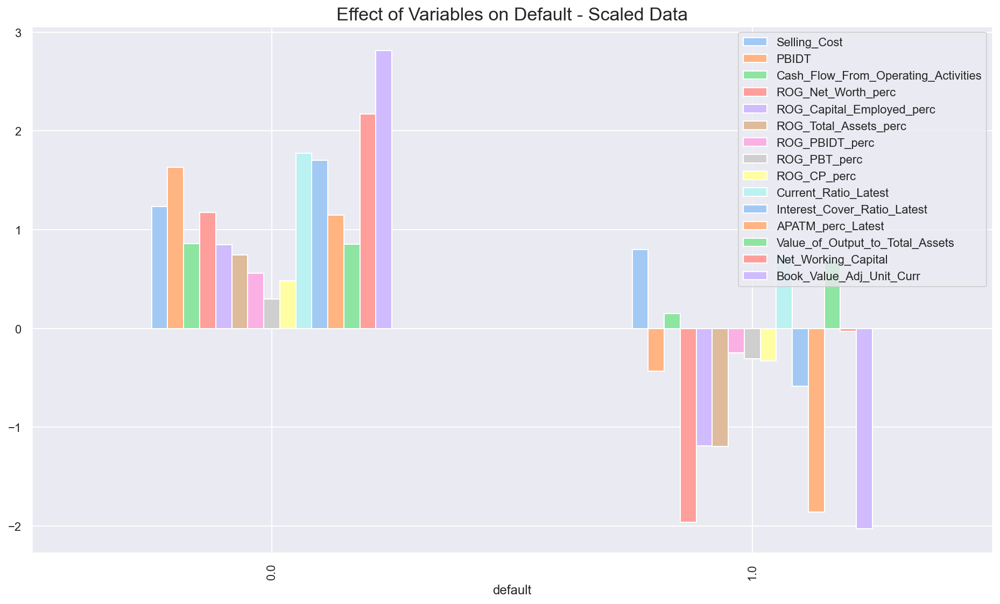

In [21]:
grp_sc.plot(kind='bar', figsize=(16,9))
plt.title('Effect of Variables on Default - Scaled Data', fontsize=17);
plt.savefig('vars_deault.jpg', bbox_inches='tight');

In [58]:
comp_scaled.shape

(3586, 16)

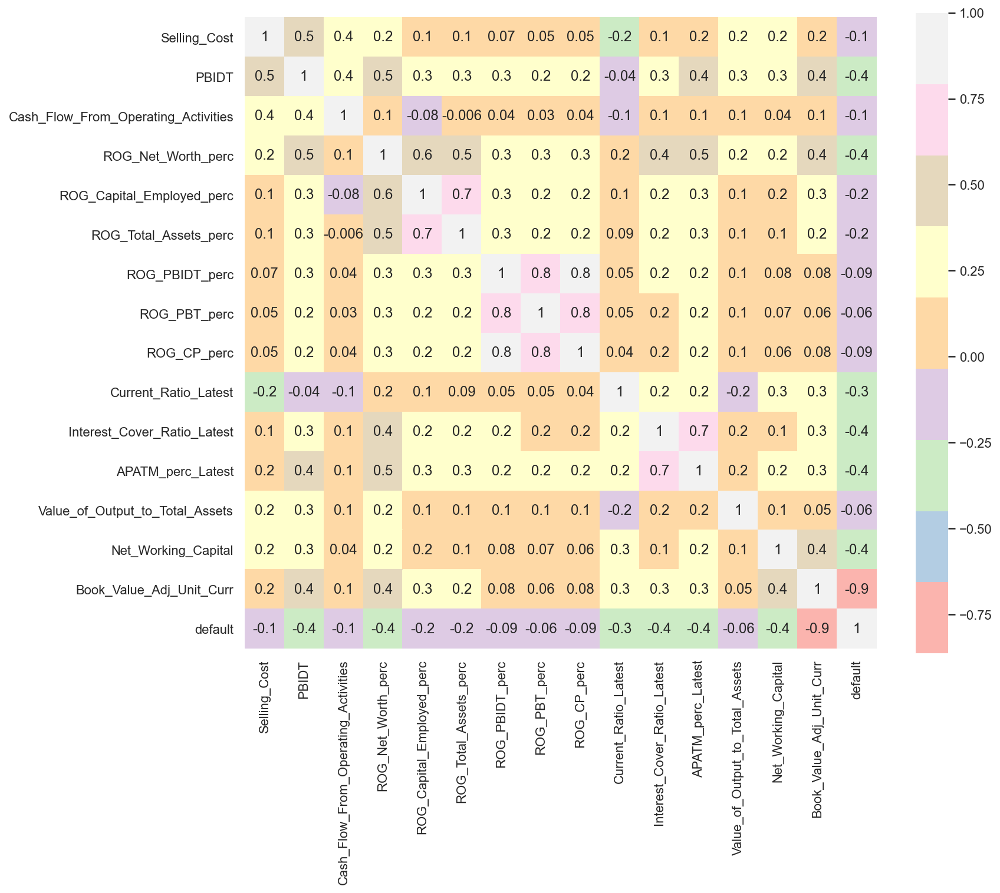

In [54]:
plt.figure(figsize=[12,10])
sns.heatmap(scaled_comp.corr(), annot=True, square=True, cmap='Pastel1', fmt='.1g')
plt.savefig('heatmap.jpg', bbox_inches='tight');

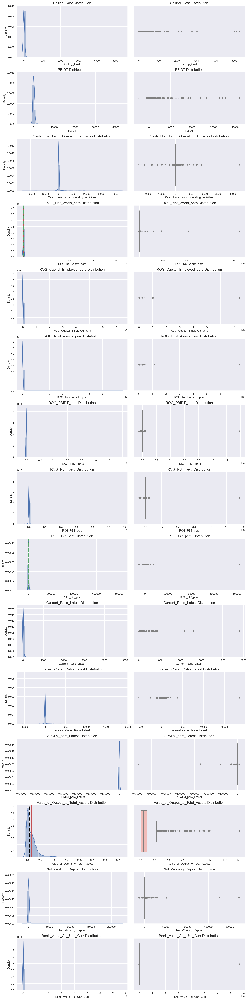

In [65]:
df = comp.drop('default', axis=1).copy()
cont=df.columns
fig, axes = plt.subplots(nrows=15,ncols=2);

fig.set_size_inches(15, 60);

for i in range(0, len(cont)):
    a = sns.distplot(df[cont[i]], ax=axes[i][0], color='b');
    a.set_title('{} Distribution'.format(cont[i]), fontsize=15);
    
    a.axvline(df[cont[i]].mean(), color='r', linewidth=1);
    a.axvline(df[cont[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(df[cont[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    a = sns.boxplot(df[cont[i]], orient = "v" , ax=axes[i][1], palette='Pastel1');
    a.set_title('{} Distribution'.format(cont[i]), fontsize=15);
    plt.tight_layout();

plt.savefig('df_Distribution.jpg', bbox_inches='tight');

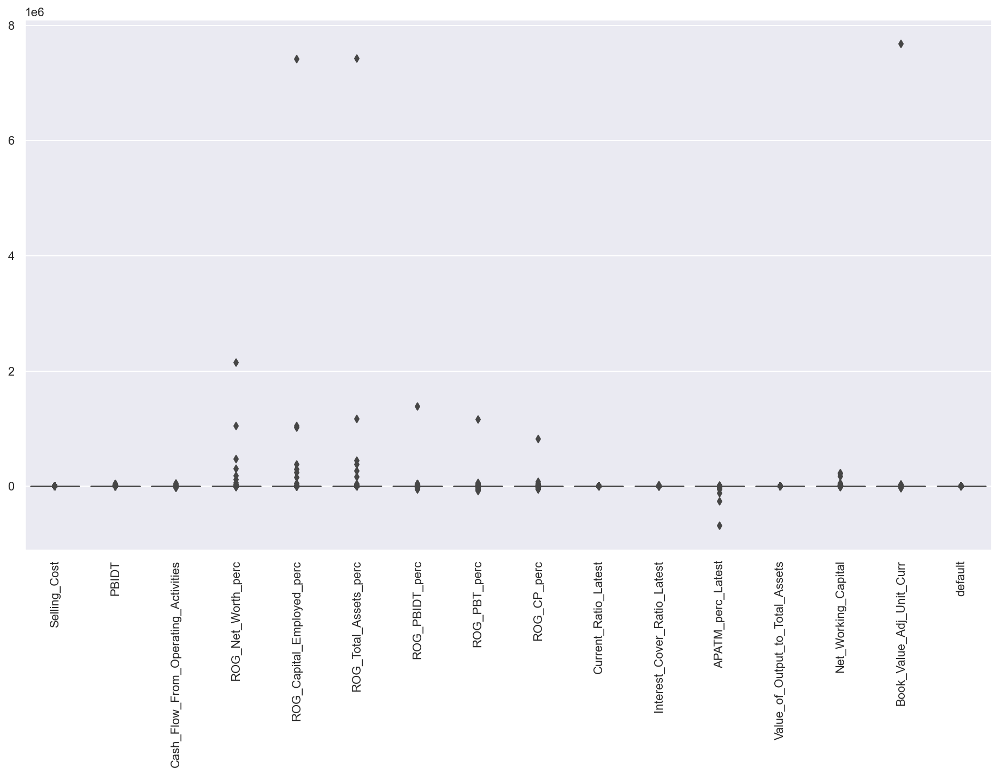

In [36]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=comp);
plt.xticks(rotation=90);
plt.savefig('out_comp.jpg', bbox_inches='tight');

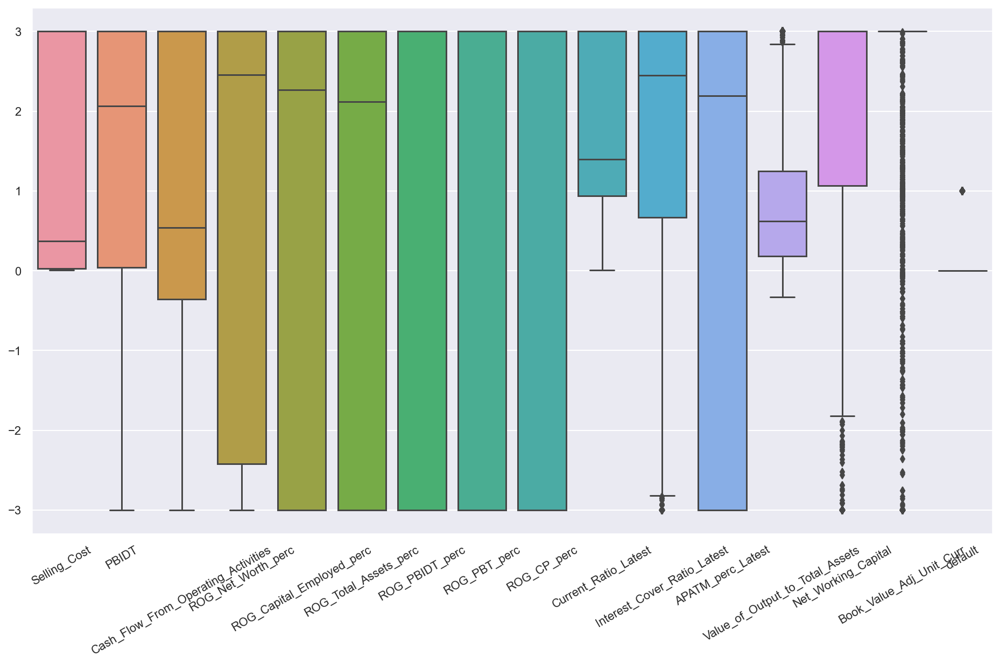

In [53]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=scaled_comp);
plt.xticks(rotation=30);
plt.savefig('out_scaled_comp.jpg', bbox_inches='tight');

In [35]:
### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Outlier Treatment using IQR method

def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range



In [46]:
comp_out = comp.copy()

for column in comp_out.columns:
    lr,ur=remove_outlier(comp_out[column])
    comp_out[column]=np.where(comp_out[column]>ur,ur,comp_out[column])
    comp_out[column]=np.where(comp_out[column]<lr,lr,comp_out[column])


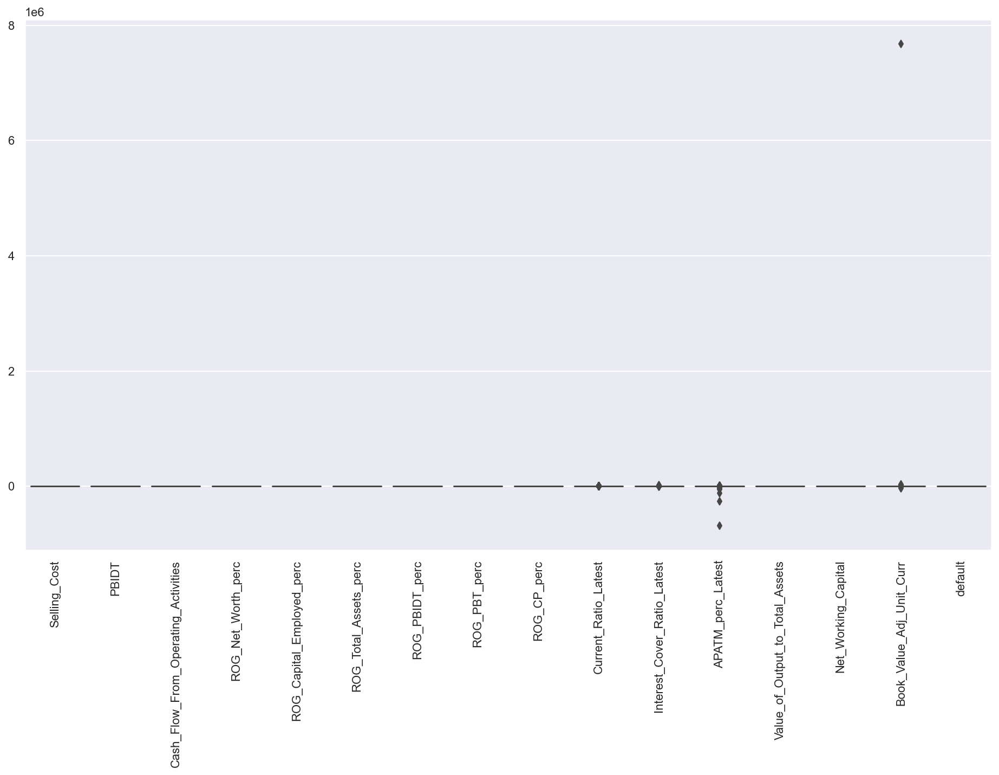

In [47]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=comp_out);
plt.xticks(rotation=90);
plt.savefig('out_iqr_comp.jpg', bbox_inches='tight');

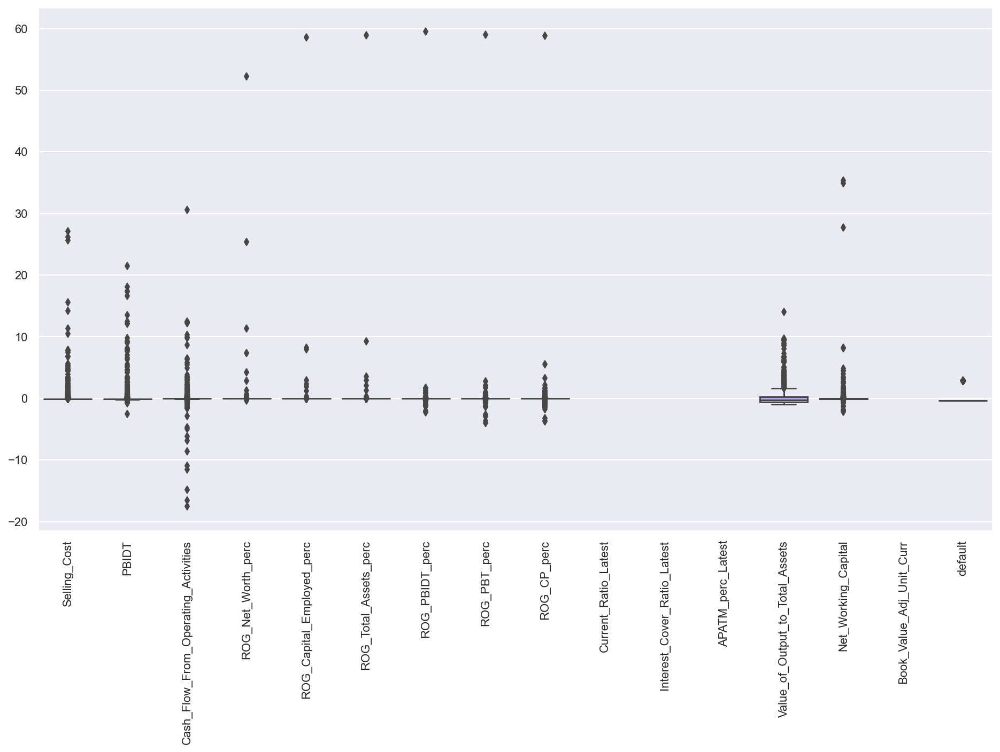

In [49]:
comp_scaled = comp.apply(zscore)

plt.figure(figsize=[16,9]);
sns.boxplot(data=comp_scaled);
plt.xticks(rotation=90);
plt.savefig('out_comp_scaled_before.jpg', bbox_inches='tight');

In [50]:
comp_out = comp_scaled.copy()

for column in comp_out.columns:
    lr,ur=remove_outlier(comp_out[column])
    comp_out[column]=np.where(comp_out[column]>ur,ur,comp_out[column])
    comp_out[column]=np.where(comp_out[column]<lr,lr,comp_out[column])



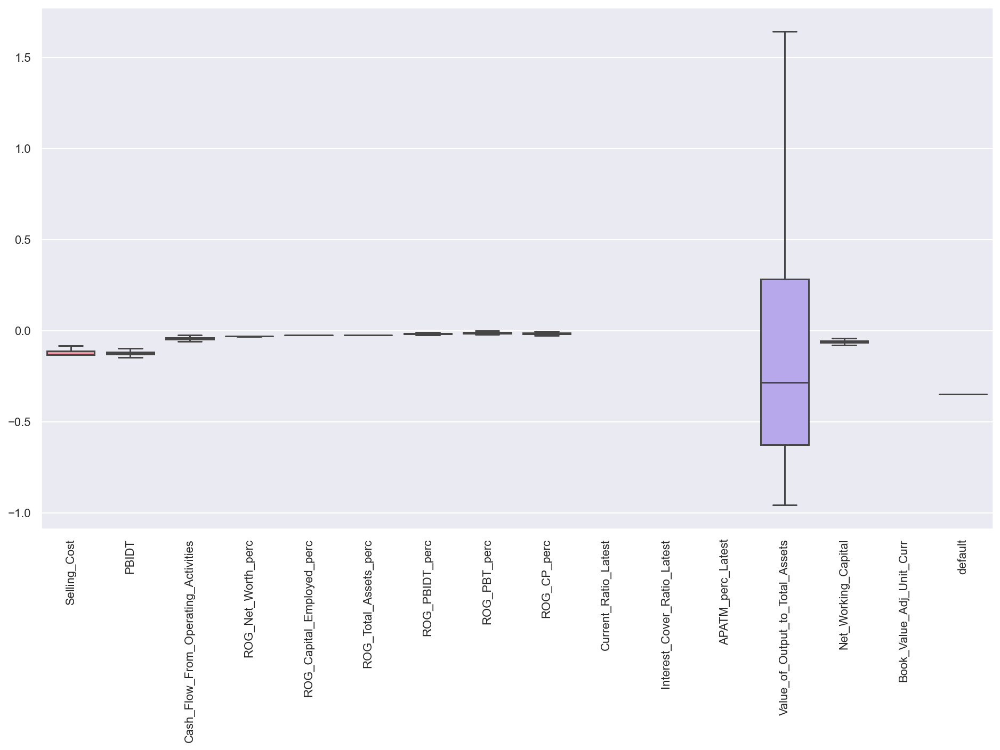

In [51]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=comp_out);
plt.xticks(rotation=90);
plt.savefig('out_comp_scaled_after.jpg', bbox_inches='tight');